In [1]:
# Se importa los paquetes necesarios
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import json
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from scipy.stats import mstats
from joblib import dump, load

In [2]:
! pip install miceforest
import miceforest as mf

# Load the Dataset

In [3]:
# Enlace
url ="https://github.com/Nolhandm/Trabajo-de-Maestria/raw/refs/heads/main/Objetivo%201%20-%20Integracion%20de%20datos/ESG_df_Completed.csv"

# Cargar en un dataFrame
ESG_df = pd.read_csv(url)
ESG_df

,Country Name,Indicator Name,1960,1961,1962,1963,1964,1965,1966,1967,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Cameroon,Access to clean fuels and technologies for coo...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,22.8000,23.6000,24.3000,25.3000,26.4000,27.4000,28.6000,29.4000,30.7000,NaN
1,Cameroon,Access to electricity (% of population),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,58.6000,59.8000,60.9000,62.2000,63.2000,64.3000,65.4000,71.0000,72.0000,NaN
2,Cameroon,"Adjusted savings, natural resources depletion ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.4405,5.2334,5.8511,5.6127,5.0737,4.0527,4.9676,NaN,NaN,NaN
3,Cameroon,"Adjusted savings, net forest depletion (% of GNI)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.6341,3.7438,3.8193,3.0194,2.6998,2.7600,2.6397,NaN,NaN,NaN
4,Cameroon,Agricultural land (% of land area),NaN,15.8871,16.014,16.1198,16.2467,16.3737,16.5006,16.6487,...,20.6258,20.6258,20.6258,20.6258,20.6258,20.6258,20.6258,20.6258,20.9400,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19041,American Samoa,Total greenhouse gas emissions per capita excl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.1589,0.1608,0.1628,0.1650,0.1693,0.1708,0.1727,0.1758,0.1789,NaN
19042,American Samoa,Tree Cover Loss,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19043,American Samoa,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19044,American Samoa,Unmet need for contraception (% of married wom...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


On a le bon nombre de données 89 ind * 214 pays = 19046

# Utilities

In [4]:
# Dictionnaire de mapping des noms de pays
url = "https://github.com/Nolhandm/Trabajo-de-Maestria/raw/refs/heads/main/Objetivo%201%20-%20Integracion%20de%20datos/Utilidad/country_name_map.json"
response = requests.get(url)
country_name_map = json.loads(response.text)

In [5]:
# Number of countries
nb_countries = ESG_df['Country Name'].nunique()
print(f"Number of countries: {nb_countries}")

# Number of years
nb_years = ESG_df.drop(columns=["Country Name","Indicator Name"]).shape[1]
print(f"Number of years: {nb_years}")

# Number of variables
nb_indicators = ESG_df['Indicator Name'].nunique()
print(f"Number of variables: {nb_indicators}")

Number of countries: 214
Number of years: 65
Number of variables: 89


In [6]:
# Dataframe in long format
ESG_df_long = pd.melt(
    ESG_df,
    id_vars=['Country Name', 'Indicator Name'],
    var_name='Year',
    value_name='Value'
)
ESG_df_long

,Country Name,Indicator Name,Year,Value
0,Cameroon,Access to clean fuels and technologies for coo...,1960,NaN
1,Cameroon,Access to electricity (% of population),1960,NaN
2,Cameroon,"Adjusted savings, natural resources depletion ...",1960,NaN
3,Cameroon,"Adjusted savings, net forest depletion (% of GNI)",1960,NaN
4,Cameroon,Agricultural land (% of land area),1960,NaN
...,...,...,...,...
1237985,American Samoa,Total greenhouse gas emissions per capita excl...,2024,NaN
1237986,American Samoa,Tree Cover Loss,2024,NaN
1237987,American Samoa,"Unemployment, total (% of total labor force) (...",2024,NaN
1237988,American Samoa,Unmet need for contraception (% of married wom...,2024,NaN


# Visualize missing data and data repartition

In [7]:
 # % de valeurs manquantes sur l'ensemble du dataset

 (ESG_df.drop(columns=["Country Name","Indicator Name"]).count()/ESG_df.shape[0]*100).mean()

np.float64(45.263370463412464)

## Missing data by Year

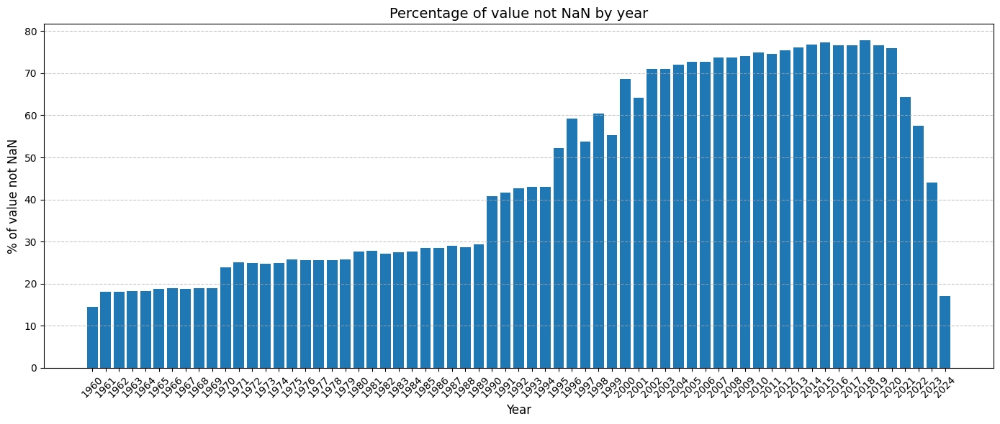

In [8]:
# Number maximal of data by Year (19260)
nb_data_by_year = nb_countries*nb_indicators

# Compute % of data
df_year = ESG_df.drop(columns=["Country Name","Indicator Name"]).notna().sum()/nb_data_by_year*100

# Show the repartition
plt.figure(figsize=(14, 6))
plt.bar(df_year.index, df_year.values)
plt.title("Percentage of value not NaN by year", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Missing data by Indicator

/tmp/ipython-input-3771822346.py:23: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


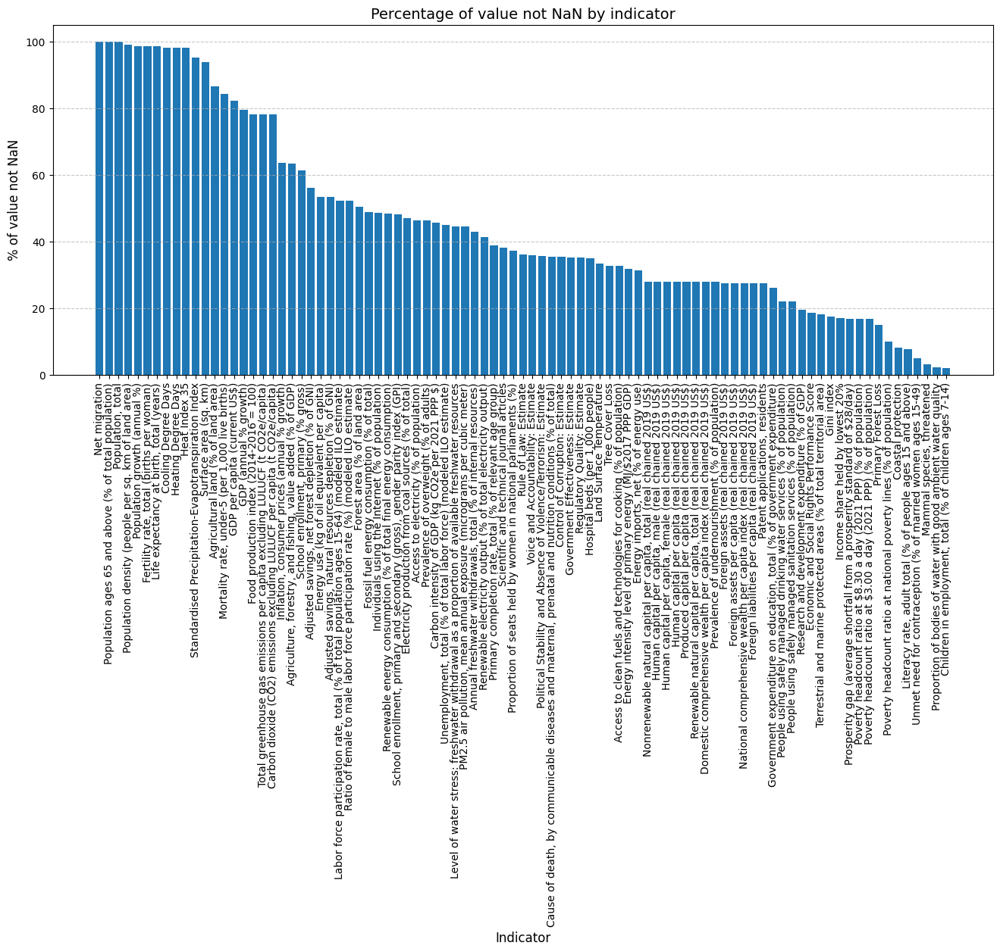

In [9]:
# Number maximal of data by Indicator (13910)
nb_data_by_indicator = nb_countries*nb_years

# Put the indicators in columns
df_ind = ESG_df_long.pivot_table(
    index=['Country Name', 'Year'],
    columns='Indicator Name',
    values='Value'
).reset_index()

# Compute % of data
df_ind = df_ind.drop(columns=["Country Name","Year"]).notna().sum()/nb_data_by_indicator*100
df_ind.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(16, 6))
plt.bar(df_ind.index, df_ind.values)
plt.title("Percentage of value not NaN by indicator", fontsize=14)
plt.xlabel("Indicator", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90,ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Missing data by Country

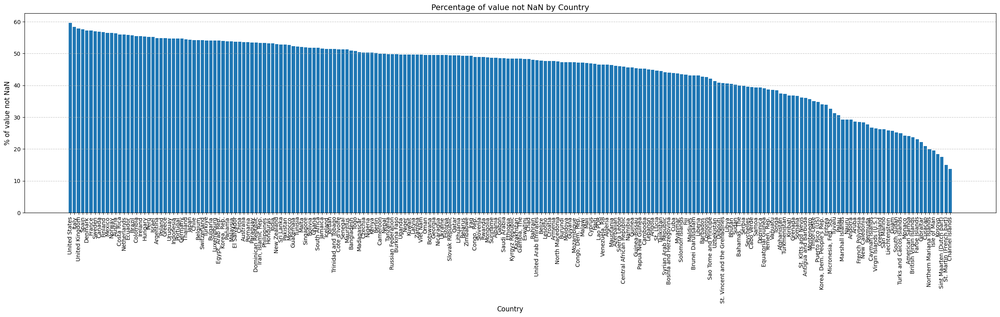

In [10]:
# Number maximal of data by Country (5850)
nb_data_by_country = nb_indicators*nb_years

# Put the Countries in columns
df_countries = ESG_df_long.pivot_table(
    index=['Indicator Name', 'Year'],
    columns='Country Name',
    values='Value'
).reset_index()

# Compute % of data
df_countries = df_countries.drop(columns=["Year","Indicator Name"]).notna().sum()/nb_data_by_country*100
df_countries.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(25, 8))
plt.bar(df_countries.index, df_countries.values)
plt.title("Percentage of value not NaN by Country", fontsize=14)
plt.xlabel("Country", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [11]:
print(nb_data_by_year)
print(nb_data_by_indicator)
print(nb_data_by_country)

19046
13910
5785


# Handling missing data

## Handling data by Year

Nous allons conserver uniquement les données entre 2000 et 2022 (qui ont toutes au moins 65% de données)

In [12]:
# Columns between 2000 and 2022
cols = [str(i) for i in range(2000, 2023)]

# Keep only the columns we want
ESG_df = ESG_df[["Country Name","Indicator Name"]+cols]

# New ESG_df_long
ESG_df_long = pd.melt(
    ESG_df,
    id_vars=['Country Name', 'Indicator Name'],
    var_name='Year',
    value_name='Value'
)

# New nb_years
nb_years = ESG_df.drop(columns=["Country Name","Indicator Name"]).shape[1]
print(f"Number of years: {nb_years}")

Number of years: 23


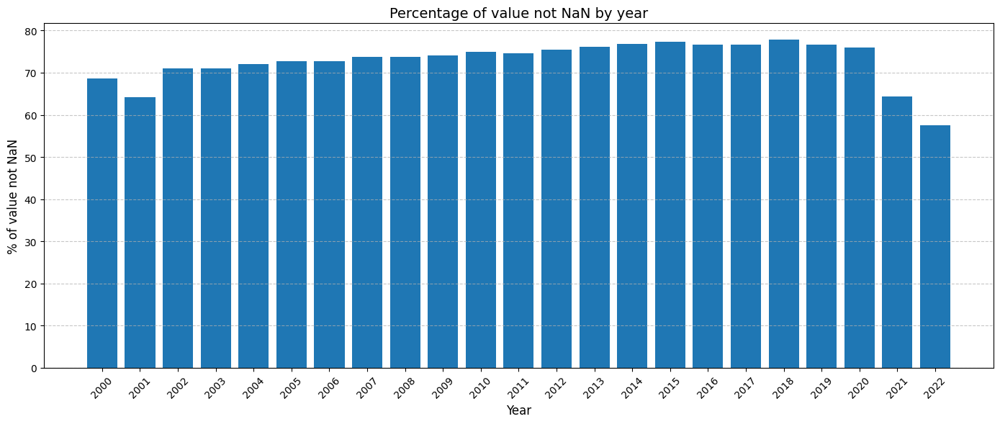

In [13]:
# Number maximal of data by Year (19260)
nb_data_by_year = nb_countries*nb_indicators

# Compute % of data
df_year = ESG_df.drop(columns=["Country Name","Indicator Name"]).notna().sum()/nb_data_by_year*100

# Show the repartition
plt.figure(figsize=(14, 6))
plt.bar(df_year.index, df_year.values)
plt.title("Percentage of value not NaN by year", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Missing data by Indicator

/tmp/ipython-input-2309240540.py:23: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


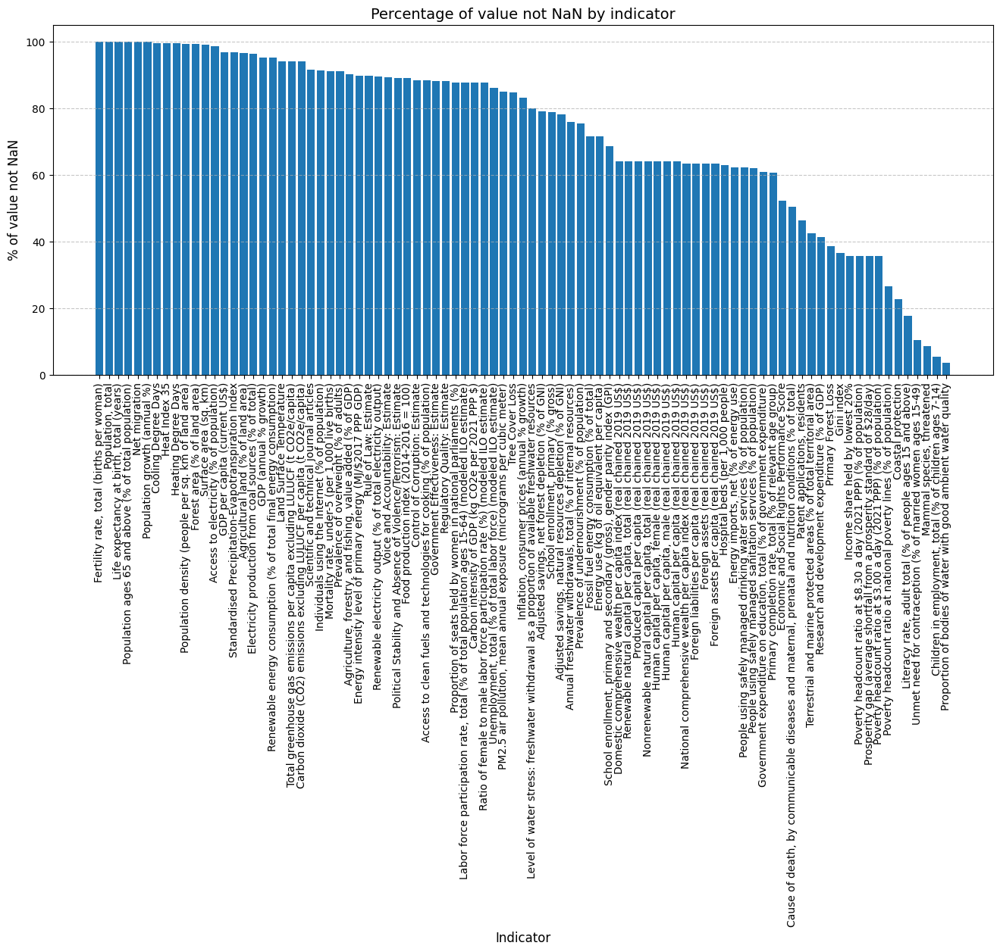

In [14]:
# Number maximal of data by Indicator (now 4922)
nb_data_by_indicator = nb_countries*nb_years

# Put the indicators in columns
df_ind = ESG_df_long.pivot_table(
    index=['Country Name', 'Year'],
    columns='Indicator Name',
    values='Value'
).reset_index()

# Compute % of data
df_ind = df_ind.drop(columns=["Country Name","Year"]).notna().sum()/nb_data_by_indicator*100
df_ind.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(16, 6))
plt.bar(df_ind.index, df_ind.values)
plt.title("Percentage of value not NaN by indicator", fontsize=14)
plt.xlabel("Indicator", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90,ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Missing data by Country

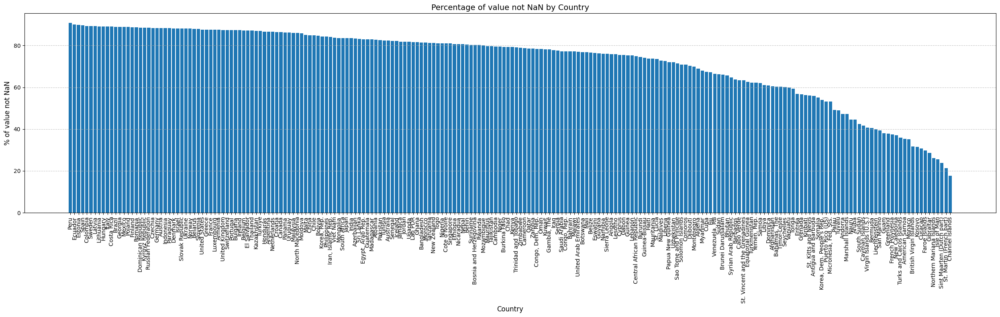

In [15]:
# Number maximal of data by Country (now 2070)
nb_data_by_country = nb_indicators*nb_years

# Put the Countries in columns
df_countries = ESG_df_long.pivot_table(
    index=['Indicator Name', 'Year'],
    columns='Country Name',
    values='Value'
).reset_index()

# Compute % of data
df_countries = df_countries.drop(columns=["Year","Indicator Name"]).notna().sum()/nb_data_by_country*100
df_countries.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(25, 8))
plt.bar(df_countries.index, df_countries.values)
plt.title("Percentage of value not NaN by Country", fontsize=14)
plt.xlabel("Country", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [16]:
print(nb_data_by_year)
print(nb_data_by_indicator)
print(nb_data_by_country)

19046
4922
2047


## Handling data by Indicator

Nous allons garder uniquement les indicateurs avec un % > 75%

In [17]:
# List of indicator with at least 75 % of data
list_ind = df_ind[df_ind.values >= 70].index

# Keep only the data we want
ESG_df = ESG_df[ESG_df["Indicator Name"].isin(list_ind)]

# New ESG_df_long
ESG_df_long = pd.melt(
    ESG_df,
    id_vars=['Country Name', 'Indicator Name'],
    var_name='Year',
    value_name='Value'
)

# New nb_ind
nb_indicators = ESG_df["Indicator Name"].nunique()
print(f"Number of Indicators: {nb_indicators}")

Number of Indicators: 53


/tmp/ipython-input-2309240540.py:23: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


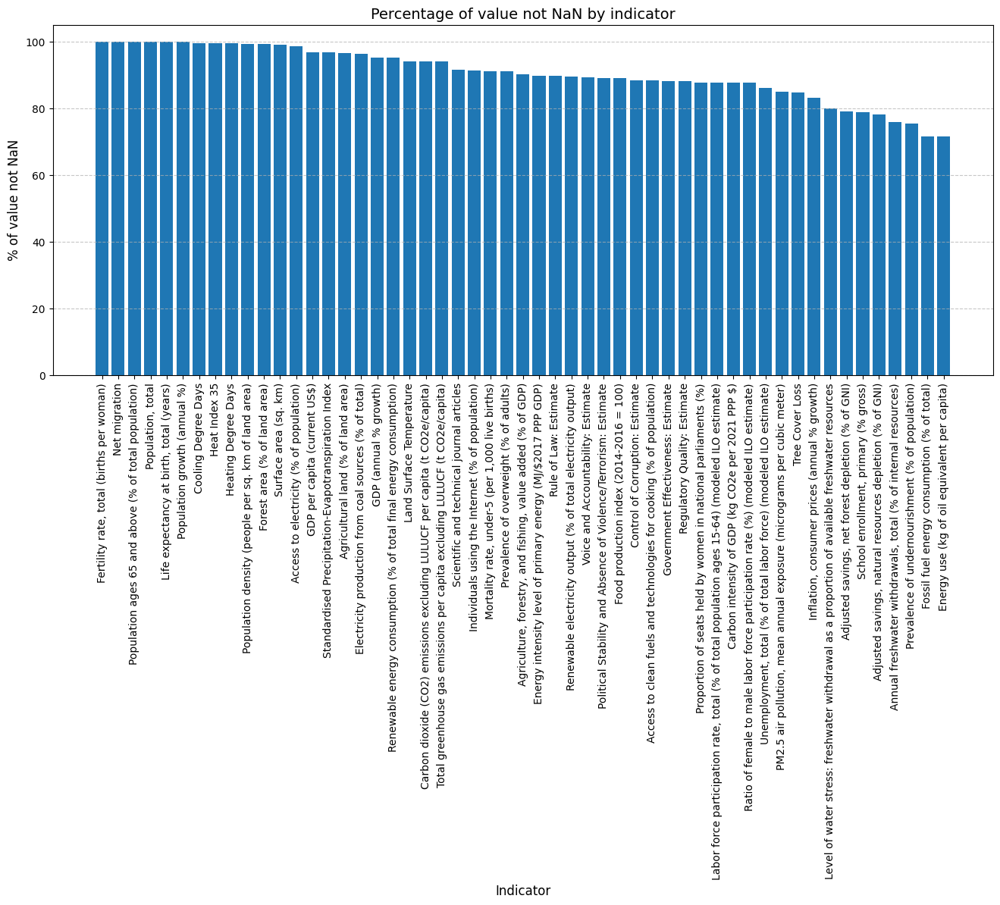

In [18]:
# Number maximal of data by Indicator (now 4922)
nb_data_by_indicator = nb_countries*nb_years

# Put the indicators in columns
df_ind = ESG_df_long.pivot_table(
    index=['Country Name', 'Year'],
    columns='Indicator Name',
    values='Value'
).reset_index()

# Compute % of data
df_ind = df_ind.drop(columns=["Country Name","Year"]).notna().sum()/nb_data_by_indicator*100
df_ind.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(16, 6))
plt.bar(df_ind.index, df_ind.values)
plt.title("Percentage of value not NaN by indicator", fontsize=14)
plt.xlabel("Indicator", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90,ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Missing data by Year

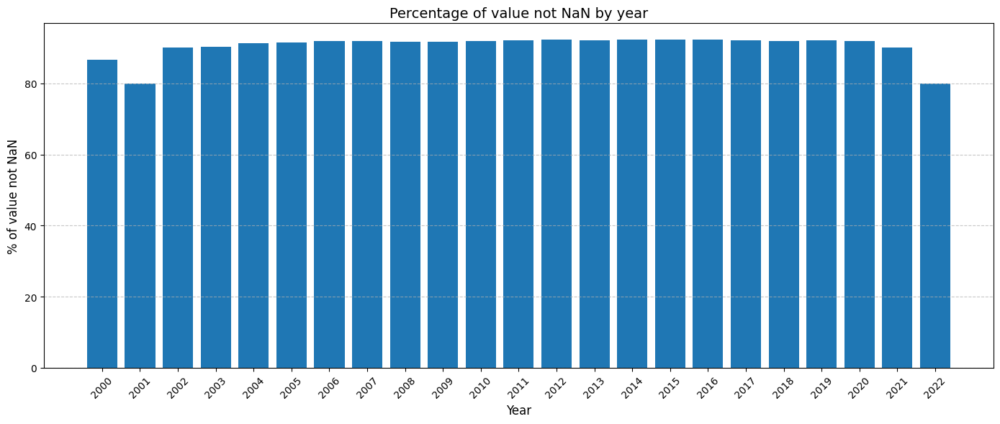

In [19]:
# Number maximal of data by Year (now 10914)
nb_data_by_year = nb_countries*nb_indicators

# Compute % of data
df_year = ESG_df.drop(columns=["Country Name","Indicator Name"]).notna().sum()/nb_data_by_year*100

# Show the repartition
plt.figure(figsize=(14, 6))
plt.bar(df_year.index, df_year.values)
plt.title("Percentage of value not NaN by year", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Missing data by Country

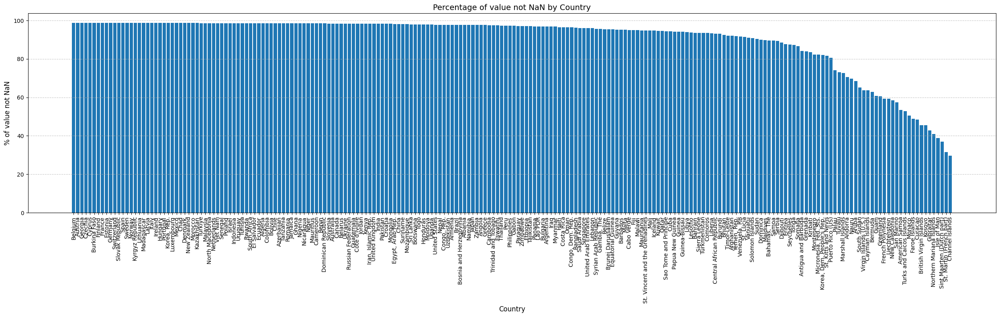

In [20]:
# Number maximal of data by Country (now 1173)
nb_data_by_country = nb_indicators*nb_years

# Put the Countries in columns
df_countries = ESG_df_long.pivot_table(
    index=['Indicator Name', 'Year'],
    columns='Country Name',
    values='Value'
).reset_index()

# Compute % of data
df_countries = df_countries.drop(columns=["Year","Indicator Name"]).notna().sum()/nb_data_by_country*100
df_countries.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(25, 8))
plt.bar(df_countries.index, df_countries.values)
plt.title("Percentage of value not NaN by Country", fontsize=14)
plt.xlabel("Country", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [21]:
print(nb_data_by_year)
print(nb_data_by_indicator)
print(nb_data_by_country)

11342
4922
1219


## Handling data by Country

On va conserver uniquement les pays avec 80% de données

In [22]:
# List of Country with at least 80 % of data
list_country = df_countries[df_countries.values >= 80].index

# Keep only the data we want
ESG_df = ESG_df[ESG_df["Country Name"].isin(list_country)]

# New ESG_df_long
ESG_df_long = pd.melt(
    ESG_df,
    id_vars=['Country Name', 'Indicator Name'],
    var_name='Year',
    value_name='Value'
)

# New nb_countries
nb_countries = ESG_df["Country Name"].nunique()
print(f"Number of countries: {nb_countries}")

Number of countries: 185


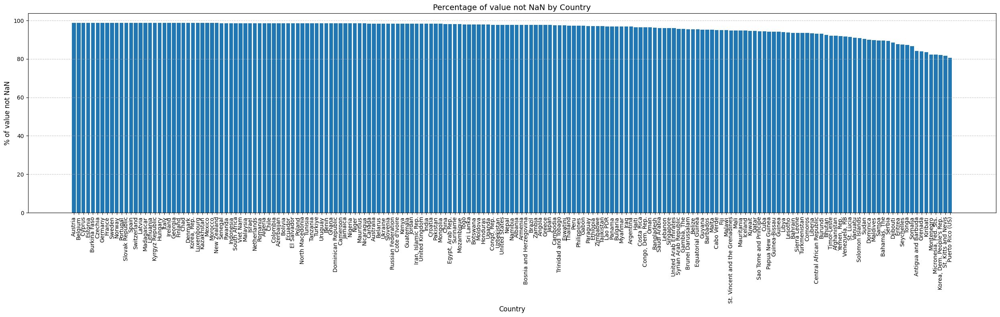

In [23]:
# Number maximal of data by Country (now 1173)
nb_data_by_country = nb_indicators*nb_years

# Put the Countries in columns
df_countries = ESG_df_long.pivot_table(
    index=['Indicator Name', 'Year'],
    columns='Country Name',
    values='Value'
).reset_index()

# Compute % of data
df_countries = df_countries.drop(columns=["Year","Indicator Name"]).notna().sum()/nb_data_by_country*100
df_countries.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(25, 8))
plt.bar(df_countries.index, df_countries.values)
plt.title("Percentage of value not NaN by Country", fontsize=14)
plt.xlabel("Country", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Missing data by Year

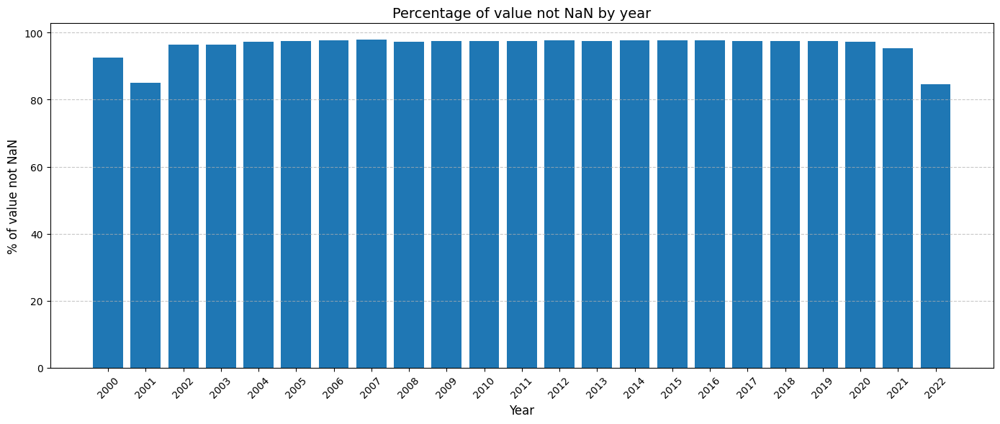

In [24]:
# Number maximal of data by Year (now 9435)
nb_data_by_year = nb_countries*nb_indicators

# Compute % of data
df_year = ESG_df.drop(columns=["Country Name","Indicator Name"]).notna().sum()/nb_data_by_year*100

# Show the repartition
plt.figure(figsize=(14, 6))
plt.bar(df_year.index, df_year.values)
plt.title("Percentage of value not NaN by year", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Missing data by Indicator

/tmp/ipython-input-1492747031.py:23: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


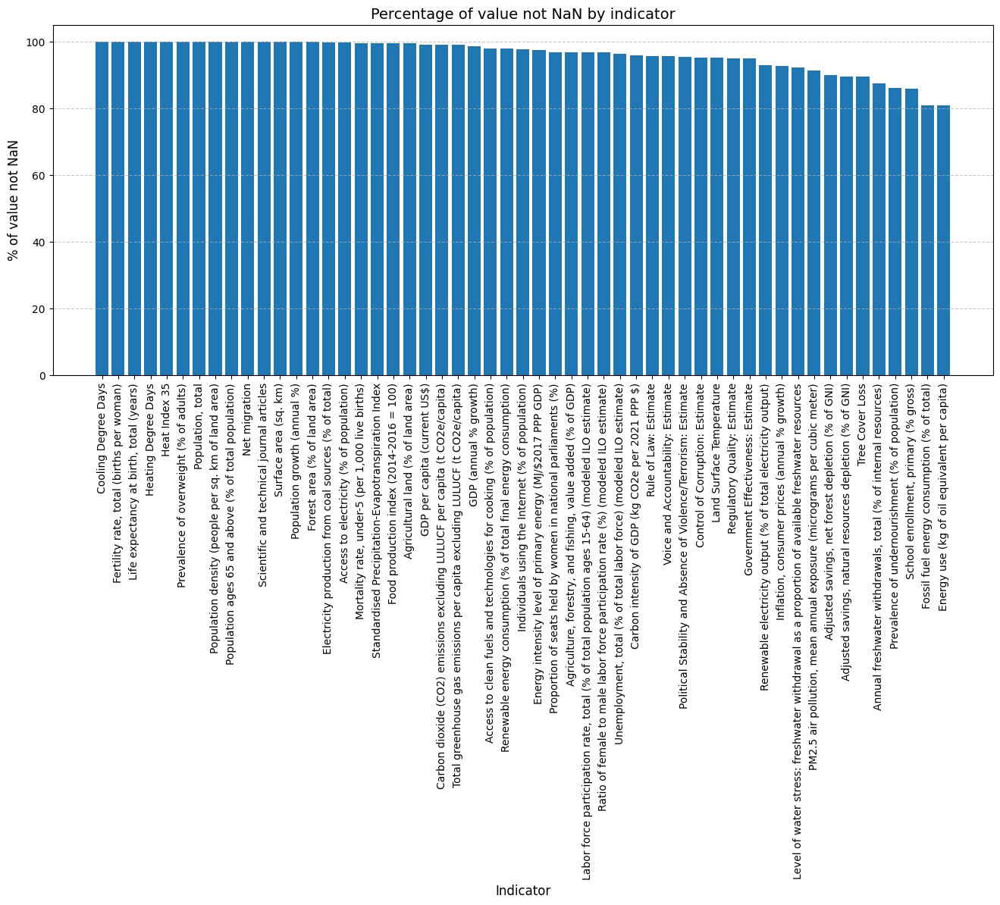

In [25]:
# Number maximal of data by Indicator (now 4255)
nb_data_by_indicator = nb_countries*nb_years

# Put the indicators in columns
df_ind = ESG_df_long.pivot_table(
    index=['Country Name', 'Year'],
    columns='Indicator Name',
    values='Value'
).reset_index()

# Compute % of data
df_ind = df_ind.drop(columns=["Country Name","Year"]).notna().sum()/nb_data_by_indicator*100
df_ind.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(16, 6))
plt.bar(df_ind.index, df_ind.values)
plt.title("Percentage of value not NaN by indicator", fontsize=14)
plt.xlabel("Indicator", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90,ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [26]:
print(nb_data_by_year)
print(nb_data_by_indicator)
print(nb_data_by_country)

9805
4255
1219


In [27]:
 # % de valeurs manquantes sur l'ensemble du dataset

 (ESG_df.drop(columns=["Country Name","Indicator Name"]).count()/ESG_df.shape[0]*100).mean()

np.float64(95.99804891027203)

# Data Imputation

## Vérifier données imputables

In [28]:
# We put the indicators in columns
ESG_df_ByInd = ESG_df_long.pivot_table(
    index=['Country Name', 'Year'],
    columns='Indicator Name',
    values='Value'
).reset_index()
ESG_df_ByInd.sort_values(by=["Country Name","Year"], inplace=True)

# keep a copy
ESG_df_ByInd_copy = ESG_df_ByInd.copy()

In [29]:
# Compute le % de valeur présente pour chaque paire indicateur/pays
missing_data = ESG_df_ByInd.drop(columns=["Year"]).groupby("Country Name").count().reset_index()
cols = missing_data.columns[1:]
missing_data[cols] = missing_data[cols]/nb_years*100

# Récuperer les données à moins de 78% -> 5 valeurs manquantes max
seuil = 78
mask = missing_data.drop(columns=["Country Name"]).lt(seuil)
rows, cols = np.where(mask)

# Construire un DataFrame avec les résultats
missing_behind_seuil = pd.DataFrame({
    "Country Name": missing_data.iloc[rows]["Country Name"].values,
    "Indicator Name": mask.columns[cols],
    "Value": missing_data.drop(columns=["Country Name"]).values[rows, cols]
})

missing_behind_seuil.head()

,Country Name,Indicator Name,Value
0,Afghanistan,"Adjusted savings, natural resources depletion ...",56.521739
1,Afghanistan,"Adjusted savings, net forest depletion (% of GNI)",56.521739
2,Afghanistan,Energy use (kg of oil equivalent per capita),0.000000
3,Afghanistan,Fossil fuel energy consumption (% of total),0.000000
4,Albania,Renewable electricity output (% of total elect...,47.826087


In [30]:
# Compute most problematic country
problematic_country = missing_behind_seuil.drop(columns=["Value"]).groupby(["Country Name"]).count().reset_index().sort_values(by="Indicator Name", ascending=False)
print(f"Nombre de pays avec données non imputables : {len(problematic_country)}")
problematic_country.head()

Nombre de pays avec données non imputables : 102


,Country Name,Indicator Name
59,Montenegro,13
45,"Korea, Dem. People's Rep.",10
74,Serbia,10
69,Puerto Rico (US),10
81,St. Kitts and Nevis,10


In [31]:
# Compute most problematic indicator
problematic_ind = missing_behind_seuil.drop(columns=["Value"]).groupby(["Indicator Name"]).count().reset_index().sort_values(by="Country Name", ascending=False)
print(f"Nombre d'indicateurs avec données non imputables : {len(problematic_ind)}")
problematic_ind.head()

Nombre d'indicateurs avec données non imputables : 31


,Indicator Name,Country Name
10,Energy use (kg of oil equivalent per capita),40
12,Fossil fuel energy consumption (% of total),40
26,"School enrollment, primary (% gross)",39
6,"Annual freshwater withdrawals, total (% of int...",24
19,Level of water stress: freshwater withdrawal a...,21


In [32]:
# On veut garder celui-là
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Energy use (kg of oil equivalent per capita)"]['Country Name'].unique()

array(['Afghanistan', 'Antigua and Barbuda', 'Bahamas, The', 'Barbados',
       'Belize', 'Bhutan', 'Burundi', 'Cabo Verde',
       'Central African Republic', 'Comoros', 'Djibouti', 'Dominica',
       'Fiji', 'Gambia, The', 'Grenada', 'Guinea', 'Guinea-Bissau',
       'Guyana', 'Kiribati', 'Lesotho', 'Liberia', 'Malawi', 'Maldives',
       'Mali', 'Mauritania', 'Micronesia, Fed. Sts.', 'Papua New Guinea',
       'Puerto Rico (US)', 'Samoa', 'Sao Tome and Principe', 'Seychelles',
       'Sierra Leone', 'Solomon Islands', 'Somalia',
       'St. Kitts and Nevis', 'St. Lucia',
       'St. Vincent and the Grenadines', 'Timor-Leste', 'Tonga',
       'Vanuatu'], dtype=object)

In [33]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Access to clean fuels and technologies for cooking (% of population)"]['Country Name'].unique()

array(['Bulgaria', 'Lebanon', 'Libya', 'Puerto Rico (US)'], dtype=object)

In [34]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Agriculture, forestry, and fishing, value added (% of GDP)"]['Country Name'].unique()

array(['Armenia', 'Bahrain', 'Central African Republic', 'Djibouti',
       'Equatorial Guinea', 'Eritrea', "Korea, Dem. People's Rep.",
       'Sao Tome and Principe', 'Somalia', 'St. Lucia', 'Venezuela, RB'],
      dtype=object)

In [35]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Prevalence of undernourishment (% of population)"]['Country Name'].unique()

array(['Antigua and Barbuda', 'Bahamas, The', 'Bahrain', 'Bhutan',
       'Brunei Darussalam', 'Burundi', 'Equatorial Guinea', 'Eritrea',
       'Grenada', 'Lesotho', 'Maldives', 'Micronesia, Fed. Sts.',
       'Puerto Rico (US)', 'Qatar', 'Singapore', 'St. Kitts and Nevis',
       'St. Lucia', 'Sudan', 'Tonga'], dtype=object)

In [36]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Carbon intensity of GDP (kg CO2e per 2021 PPP $)"]['Country Name'].unique()

array(['Cuba', 'Djibouti', 'Eritrea', "Korea, Dem. People's Rep.",
       'Montenegro', 'Serbia', 'Venezuela, RB', 'Yemen, Rep.'],
      dtype=object)

In [37]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Individuals using the Internet (% of population)"]['Country Name'].unique()

array(["Korea, Dem. People's Rep.", 'Sri Lanka', 'Sudan'], dtype=object)

In [38]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Adjusted savings, net forest depletion (% of GNI)"]['Country Name'].unique()

array(['Afghanistan', 'Antigua and Barbuda', 'Eritrea', 'Greece',
       'Grenada', 'Iceland', "Korea, Dem. People's Rep.", 'Malta',
       'Montenegro', 'Puerto Rico (US)', 'Serbia', 'Somalia',
       'St. Kitts and Nevis', 'Sudan', 'Turkmenistan', 'Venezuela, RB'],
      dtype=object)

In [39]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Tree Cover Loss"]['Country Name'].unique()

array(['Bahrain', 'Cabo Verde', 'Djibouti', 'Iceland', 'Kiribati',
       'Kuwait', 'Oman', 'Qatar', 'Samoa', 'Saudi Arabia', 'Tonga',
       'United Arab Emirates', 'Yemen, Rep.'], dtype=object)

In [40]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Energy intensity level of primary energy (MJ/$2017 PPP GDP)"]['Country Name'].unique()

array(['Syrian Arab Republic'], dtype=object)

In [41]:
missing_behind_seuil[missing_behind_seuil["Indicator Name"] == "Proportion of seats held by women in national parliaments (%)"]['Country Name'].unique()

array(['Brunei Darussalam', 'Fiji', 'Montenegro', 'Myanmar',
       'Puerto Rico (US)', 'Qatar', 'Serbia'], dtype=object)

## Eliminer données non imputable

On a 102 pays et 31 indicateurs avec des données non imputables. On va éliminer les indicateurs et pays les plus problématiques (choisi de manière un peu arbitraire en essayant de conserver les indicateurs intéréssants, surtout Energy use (kg of oil equivalent per capita) le plus corrélé) :

----
Garder energy use :
['Afghanistan', 'Antigua and Barbuda', 'Bahamas, The', 'Barbados',
       'Belize', 'Bhutan', 'Burundi', 'Cabo Verde',
       'Central African Republic', 'Comoros', 'Djibouti', 'Dominica',
       'Fiji', 'Gambia, The', 'Grenada', 'Guinea', 'Guinea-Bissau',
       'Guyana', 'Kiribati', 'Lesotho', 'Liberia', 'Malawi', 'Maldives',
       'Mali', 'Mauritania', 'Micronesia, Fed. Sts.', 'Papua New Guinea',
       'Puerto Rico (US)', 'Samoa', 'Sao Tome and Principe', 'Seychelles',
       'Sierra Leone', 'Solomon Islands', 'Somalia',
       'St. Kitts and Nevis', 'St. Lucia',
       'St. Vincent and the Grenadines', 'Timor-Leste', 'Tonga',
       'Vanuatu']
---
Garder Access to clean fuels and technologies for cooking (% of population) :
['Bulgaria', 'Lebanon', 'Libya']

---
Garder Agriculture, forestry, and fishing, value added (% of GDP)

['Armenia', 'Bahrain', 'Equatorial Guinea', 'Eritrea',
       "Korea, Dem. People's Rep.", 'Venezuela, RB']


----
garder Prevalence of undernourishment (% of population):

['Brunei Darussalam', 'Qatar', 'Singapore']

----

garder Carbon intensity of GDP (kg CO2e per 2021 PPP $)

['Cuba', 'Yemen, Rep.']

---

Internet:
Sri Lanka

----

net forest depletion

['Greece', 'Iceland', 'Malta', 'Turkmenistan']
['Montenegro', 'Serbia', 'Sudan']

---

Tree cover loss

['Kuwait', 'Oman', 'Saudi Arabia', 'United Arab Emirates']

---

energy intensity
Syrian Arab Republic

---

----
Eliminer ces indicateurs (bcp pays manquants et/ou peu de correlation)
['School enrollment, primary (% gross)',
       'Renewable electricity output (% of total electricity output)',
       'Annual freshwater withdrawals, total (% of internal resources)',
       'Level of water stress: freshwater withdrawal as a proportion of available freshwater resources',
       'Inflation, consumer prices (annual % growth)',
       'Proportion of seats held by women in national parliaments (%)]

In [42]:
countries_to_erase = ['Afghanistan', 'Antigua and Barbuda', 'Bahamas, The', 'Barbados',
       'Belize', 'Bhutan', 'Burundi', 'Cabo Verde',
       'Central African Republic', 'Comoros', 'Djibouti', 'Dominica',
       'Fiji', 'Gambia, The', 'Grenada', 'Guinea', 'Guinea-Bissau',
       'Guyana', 'Kiribati', 'Lesotho', 'Liberia', 'Malawi', 'Maldives',
       'Mali', 'Mauritania', 'Micronesia, Fed. Sts.', 'Papua New Guinea',
       'Puerto Rico (US)', 'Samoa', 'Sao Tome and Principe', 'Seychelles',
       'Sierra Leone', 'Solomon Islands', 'Somalia',
       'St. Kitts and Nevis', 'St. Lucia',
       'St. Vincent and the Grenadines', 'Timor-Leste', 'Tonga',
       'Vanuatu', 'Bulgaria', 'Lebanon', 'Libya','Armenia', 'Bahrain', 'Equatorial Guinea', 'Eritrea',
       "Korea, Dem. People's Rep.", 'Venezuela, RB','Brunei Darussalam', 'Qatar', 'Singapore', 'Cuba', 'Yemen, Rep.','Sri Lanka',
       'Greece', 'Iceland', 'Malta', 'Turkmenistan','Kuwait', 'Oman', 'Saudi Arabia', 'United Arab Emirates','Montenegro', 'Serbia', 'Sudan',
       'Syrian Arab Republic']


indicators_to_erase =['School enrollment, primary (% gross)',
       'Renewable electricity output (% of total electricity output)',
       'Annual freshwater withdrawals, total (% of internal resources)',
       'Level of water stress: freshwater withdrawal as a proportion of available freshwater resources',
       'Inflation, consumer prices (annual % growth)',
       'Proportion of seats held by women in national parliaments (%)']

ESG_df_ByInd = ESG_df_ByInd[~ESG_df_ByInd["Country Name"].isin(countries_to_erase)]
ESG_df_ByInd.drop(columns=indicators_to_erase, inplace=True, errors='ignore')

Vérifier les résultat :

In [43]:
# Compute le % de valeur présente pour chaque paire indicateur/pays
missing_data = ESG_df_ByInd.drop(columns=["Year"]).groupby("Country Name").count().reset_index()
cols = missing_data.columns[1:]
missing_data[cols] = missing_data[cols]/nb_years*100

# Récuperer les données à moins de 78% -> 5 valeurs manquantes max
seuil = 78
mask = missing_data.drop(columns=["Country Name"]).lt(seuil)
rows, cols = np.where(mask)

# Construire un DataFrame avec les résultats
missing_behind_seuil = pd.DataFrame({
    "Country Name": missing_data.iloc[rows]["Country Name"].values,
    "Indicator Name": mask.columns[cols],
    "Value": missing_data.drop(columns=["Country Name"]).values[rows, cols]
})

missing_behind_seuil.head()

,Country Name,Indicator Name,Value


In [44]:
# Compute most problematic country
problematic_country = missing_behind_seuil.drop(columns=["Value"]).groupby(["Country Name"]).count().reset_index().sort_values(by="Indicator Name", ascending=False)
print(f"Nombre de pays avec données non imputables : {len(problematic_country)}")
problematic_country.head()

Nombre de pays avec données non imputables : 0


,Country Name,Indicator Name


In [45]:
# Compute most problematic indicator
problematic_ind = missing_behind_seuil.drop(columns=["Value"]).groupby(["Indicator Name"]).count().reset_index().sort_values(by="Country Name", ascending=False)
print(f"Nombre d'indicateurs avec données non imputables : {len(problematic_ind)}")
problematic_ind.head()

Nombre d'indicateurs avec données non imputables : 0


,Indicator Name,Country Name


In [46]:
nb_countries = ESG_df_ByInd['Country Name'].nunique()
nb_countries

118

In [47]:
nb_indicators = len(ESG_df_ByInd.columns)-2
nb_indicators

47

In [48]:
 # % de valeurs manquantes sur l'ensemble du dataset

(ESG_df_ByInd.drop(columns=["Country Name","Year"]).count()/ESG_df_ByInd.shape[0]*100).mean()

np.float64(98.6610012700105)

##Imputer données

### < 10% de valeurs manquantes

In [49]:
# Compute le % de valeur présente pour chaque paire indicateur/pays
missing_data = ESG_df_ByInd.drop(columns=["Year"]).groupby("Country Name").count().reset_index()
cols = missing_data.columns[1:]
missing_data[cols] = missing_data[cols]/nb_years*100

# Récuperer les données à moins de 100% -> (à completer)
mask = missing_data.drop(columns=["Country Name"]).lt(100)
rows, cols = np.where(mask)

# Construire un DataFrame avec les résultats
missing_data = pd.DataFrame({
    "Country Name": missing_data.iloc[rows]["Country Name"].values,
    "Indicator Name": mask.columns[cols],
    "Value": missing_data.drop(columns=["Country Name"]).values[rows, cols]
})
missing_data.groupby(['Value']).count()

,Country Name,Indicator Name
Value,,
78.260870,2,2
82.608696,3,3
86.956522,2,2
91.304348,123,123
95.652174,1434,1434


In [50]:
import numpy as np
from scipy import interpolate

# On interpole que les pays avec 1 ou 2 valeurs manquantes (< 10%)
to_interpolate = set(
    missing_data.loc[missing_data['Value'] > 90, ['Country Name', 'Indicator Name']]
    .itertuples(index=False, name=None)
)

# Interpoler pour chaque indicateur pour un pays
def interpolate_selected(group):
    for ind in group.columns.difference(['Country Name']):

        # Vérifier si ce pays/indicateur est à interpoler
        if (group['Country Name'].iloc[0], ind) in to_interpolate:

            y = group[ind].values.astype(float)
            x = np.arange(len(y))

            # Masque des valeurs observées
            mask = ~np.isnan(y)

            # Interpolation linéaire + extrapolation si possible
            f = interpolate.interp1d(
                  x[mask],
                  y[mask],
                  kind='linear',
                  fill_value='extrapolate',
                  bounds_error=False)
            y_interp = f(x)
            group[ind] = y_interp
            # sinon : toutes les valeurs NaN → on laisse tel quel
    return group

# 3️⃣ — Appliquer l’interpolation pays par pays
ESG_df_ByInd = ESG_df_ByInd.groupby('Country Name', group_keys=False).apply(interpolate_selected)

/tmp/ipython-input-2971845801.py:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ESG_df_ByInd = ESG_df_ByInd.groupby('Country Name', group_keys=False).apply(interpolate_selected)


In [51]:
# Compute le % de valeur présente pour chaque paire indicateur/pays
missing_data = ESG_df_ByInd.drop(columns=["Year"]).groupby("Country Name").count().reset_index()
cols = missing_data.columns[1:]
missing_data[cols] = missing_data[cols]/nb_years*100

# Récuperer les données à moins de 100% -> (à completer)
mask = missing_data.drop(columns=["Country Name"]).lt(100)
rows, cols = np.where(mask)

# Construire un DataFrame avec les résultats
missing_data = pd.DataFrame({
    "Country Name": missing_data.iloc[rows]["Country Name"].values,
    "Indicator Name": mask.columns[cols],
    "Value": missing_data.drop(columns=["Country Name"]).values[rows, cols]
})
missing_data.groupby(['Value']).count()

,Country Name,Indicator Name
Value,,
78.260870,2,2
82.608696,3,3
86.956522,2,2


In [52]:
missing_data

,Country Name,Indicator Name,Value
0,Australia,Individuals using the Internet (% of population),86.956522
1,Belarus,Individuals using the Internet (% of population),86.956522
2,Mongolia,Individuals using the Internet (% of population),82.608696
3,Tajikistan,"Adjusted savings, natural resources depletion ...",78.260870
4,Tajikistan,"Adjusted savings, net forest depletion (% of GNI)",78.260870
5,United Kingdom,"Adjusted savings, natural resources depletion ...",82.608696
6,United Kingdom,"Adjusted savings, net forest depletion (% of GNI)",82.608696


### Individuals using the Internet (% of population)

Internet : On va interpoler linéaire, les valeurs manquantes sont regroupées, entre deux valeurs connues et l'indicateur est continue et quasi monotone croissante, à évolution linéaire donc parfait pour imputation linéaire

In [53]:
# Voir la série problématique
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Australia"][["Country Name","Individuals using the Internet (% of population)"]].reset_index()

Indicator Name,index,Country Name,Individuals using the Internet (% of population)
0,161,Australia,46.8
1,162,Australia,52.7
2,163,Australia,NaN
3,164,Australia,NaN
4,165,Australia,NaN
5,166,Australia,63.0
6,167,Australia,66.0
7,168,Australia,69.5
8,169,Australia,71.7
9,170,Australia,74.3


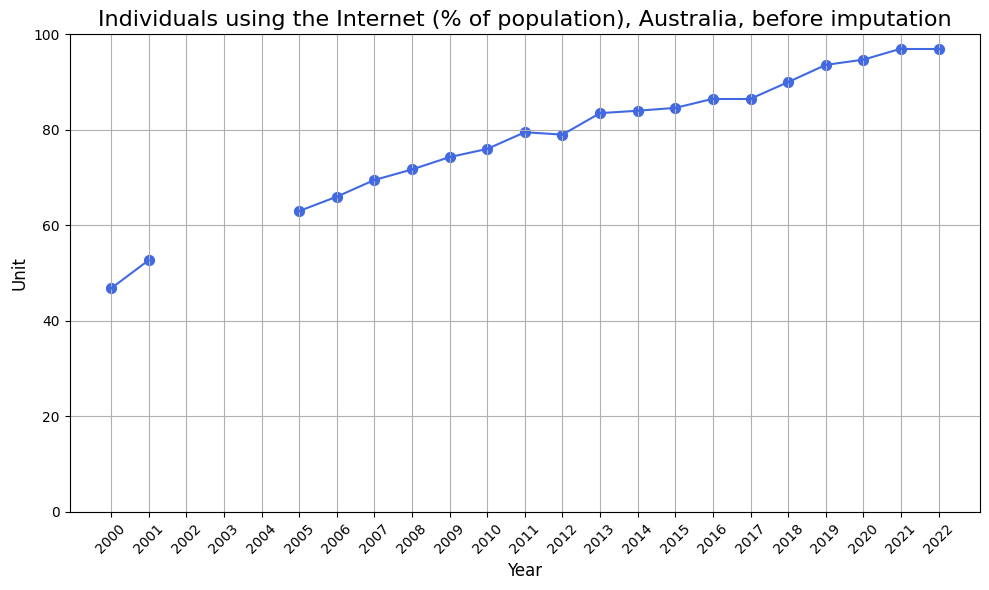

In [54]:
# Filtrer les données
pays = "Australia"
indicateur = "Individuals using the Internet (% of population)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, before imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()

In [55]:
df_mask = ESG_df_ByInd['Country Name']== "Australia"

x = np.arange(len(ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"]))
y = ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"]

mask = ~np.isnan(y)

f = interpolate.interp1d(
                  x[mask],
                  y[mask],
                  kind='linear',
                  fill_value='extrapolate',
                  bounds_error=False)
y_interp = f(x)

# update dataset
ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"] = y_interp

ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Australia"][["Country Name","Individuals using the Internet (% of population)"]].reset_index()

Indicator Name,index,Country Name,Individuals using the Internet (% of population)
0,161,Australia,46.800
1,162,Australia,52.700
2,163,Australia,55.275
3,164,Australia,57.850
4,165,Australia,60.425
5,166,Australia,63.000
6,167,Australia,66.000
7,168,Australia,69.500
8,169,Australia,71.700
9,170,Australia,74.300


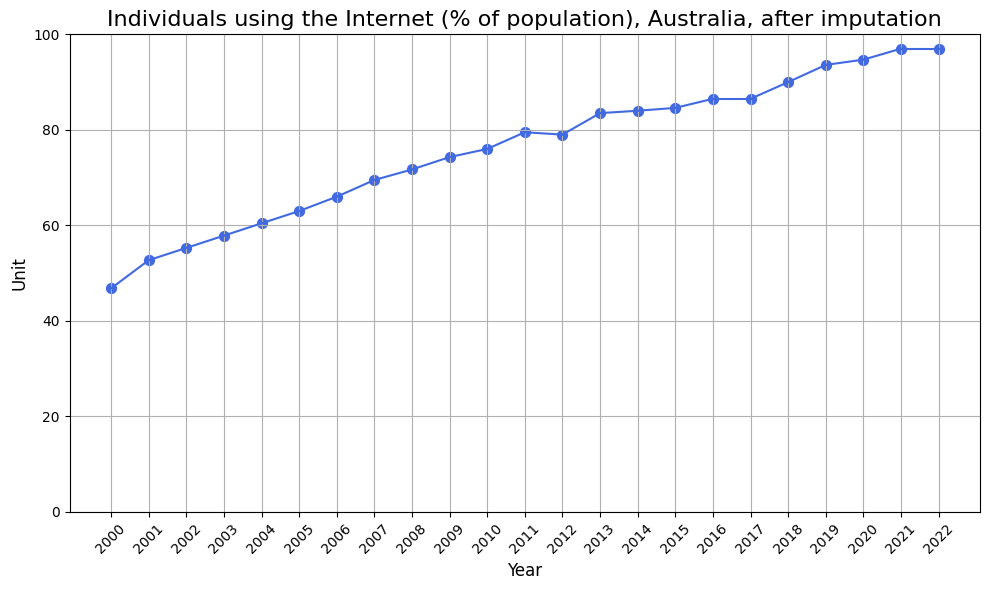

In [56]:
# Filtrer les données
pays = "Australia"
indicateur = "Individuals using the Internet (% of population)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, after imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()

In [57]:
# Voir la série problématique
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Belarus"][["Country Name","Individuals using the Internet (% of population)"]].reset_index()

Indicator Name,index,Country Name,Individuals using the Internet (% of population)
0,322,Belarus,1.86
1,323,Belarus,4.30
2,324,Belarus,8.95
3,325,Belarus,NaN
4,326,Belarus,NaN
5,327,Belarus,NaN
6,328,Belarus,16.20
7,329,Belarus,19.70
8,330,Belarus,23.00
9,331,Belarus,27.40


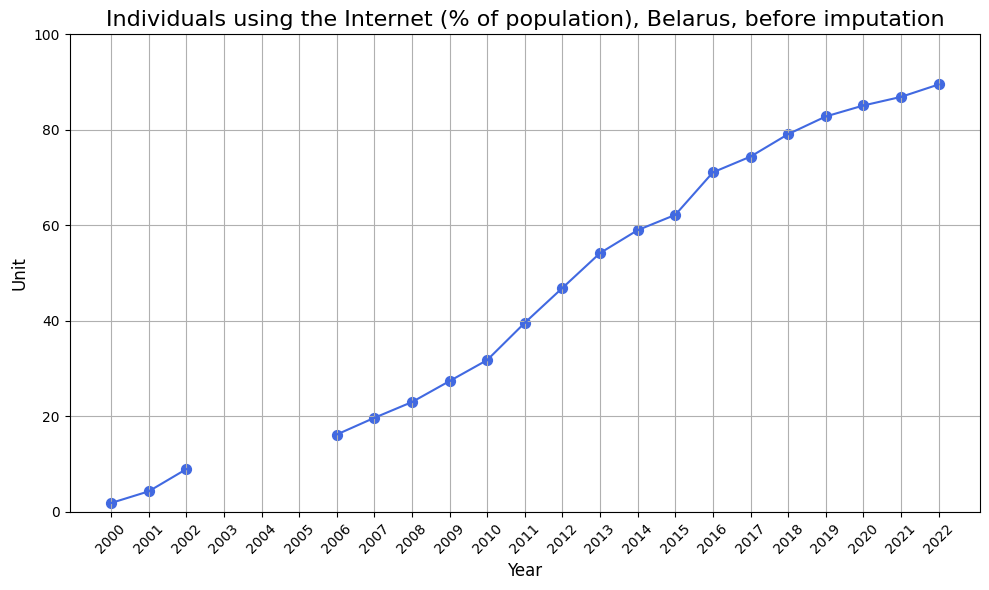

In [58]:
# Filtrer les données
pays = "Belarus"
indicateur = "Individuals using the Internet (% of population)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, before imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()

In [59]:
df_mask = ESG_df_ByInd['Country Name']== "Belarus"

x = np.arange(len(ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"]))
y = ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"]

mask = ~np.isnan(y)

f = interpolate.interp1d(
                  x[mask],
                  y[mask],
                  kind='linear',
                  fill_value='extrapolate',
                  bounds_error=False)
y_interp = f(x)

# update dataset
ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"] = y_interp

ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Belarus"][["Country Name","Individuals using the Internet (% of population)"]].reset_index()

Indicator Name,index,Country Name,Individuals using the Internet (% of population)
0,322,Belarus,1.8600
1,323,Belarus,4.3000
2,324,Belarus,8.9500
3,325,Belarus,10.7625
4,326,Belarus,12.5750
5,327,Belarus,14.3875
6,328,Belarus,16.2000
7,329,Belarus,19.7000
8,330,Belarus,23.0000
9,331,Belarus,27.4000


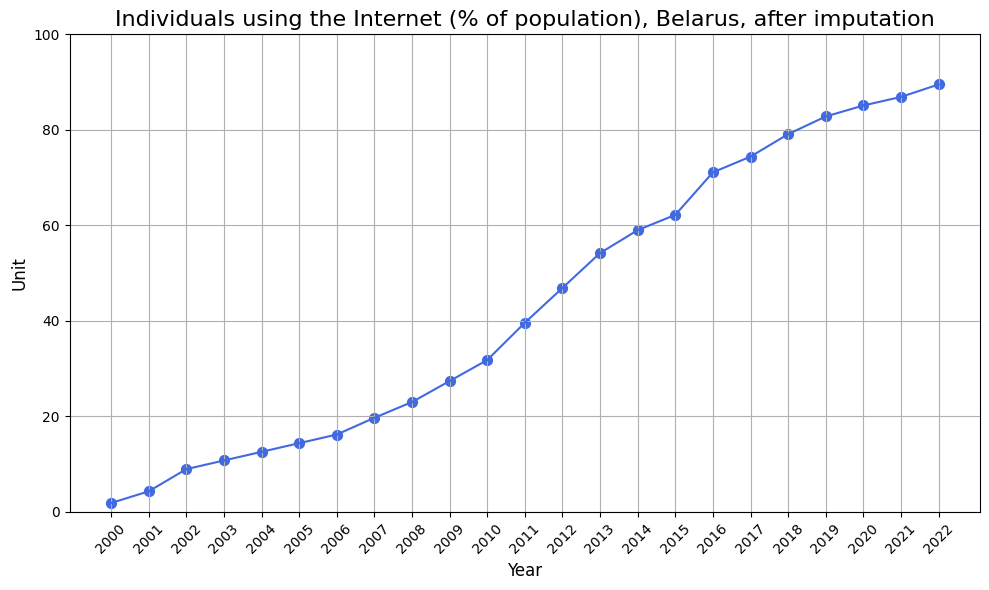

In [60]:
# Filtrer les données
pays = "Belarus"
indicateur = "Individuals using the Internet (% of population)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, after imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()

In [61]:
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Mongolia"]["Individuals using the Internet (% of population)"]

,Individuals using the Internet (% of population)
2553,1.26
2554,1.65
2555,2.04
2556,NaN
2557,NaN
2558,NaN
2559,NaN
2560,9.00
2561,9.80
2562,10.00


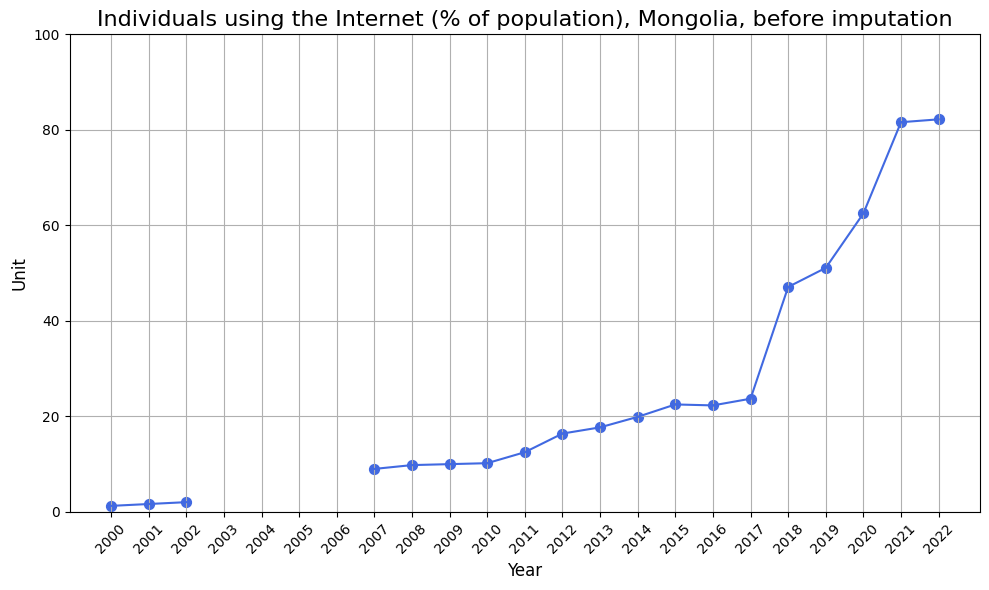

In [62]:
# Filtrer les données
pays = "Mongolia"
indicateur = "Individuals using the Internet (% of population)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, before imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()

In [63]:
df_mask = ESG_df_ByInd['Country Name']== "Mongolia"

x = np.arange(len(ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"]))
y = ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"]

mask = ~np.isnan(y)

f = interpolate.interp1d(
                  x[mask],
                  y[mask],
                  kind='linear',
                  fill_value='extrapolate',
                  bounds_error=False)
y_interp = f(x)

# update dataset
ESG_df_ByInd.loc[df_mask,"Individuals using the Internet (% of population)"] = y_interp

ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Mongolia"][["Country Name","Individuals using the Internet (% of population)"]].reset_index()

Indicator Name,index,Country Name,Individuals using the Internet (% of population)
0,2553,Mongolia,1.260
1,2554,Mongolia,1.650
2,2555,Mongolia,2.040
3,2556,Mongolia,3.432
4,2557,Mongolia,4.824
5,2558,Mongolia,6.216
6,2559,Mongolia,7.608
7,2560,Mongolia,9.000
8,2561,Mongolia,9.800
9,2562,Mongolia,10.000


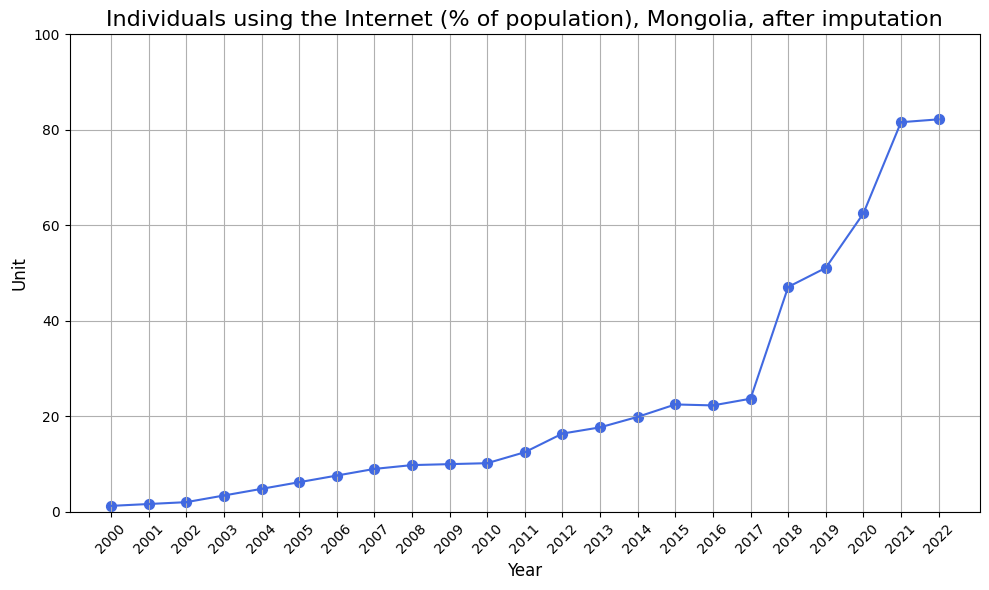

In [64]:
# Filtrer les données
pays = "Mongolia"
indicateur = "Individuals using the Internet (% of population)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, after imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()

### Adjusted savings, net forest depletion (% of GNI)

Cet indicateur est plus complexe, car évolue en fonction des prix annuels du bois et de l'économie du pays, donc peut varier fortement d'une année à l'autre. Pour UK on peut en revanche supposer que cette valeur reste à 0 tout du long, son économie est stable et ne repose pas sur le travail des fôret, on ne notte d'ailleurs pas d'évolution particulière de la déforestation https://www.globalforestwatch.org/dashboards/country/GBR/.

In [65]:
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "United Kingdom"]["Adjusted savings, net forest depletion (% of GNI)"]

,"Adjusted savings, net forest depletion (% of GNI)"
4025,0.0
4026,0.0
4027,0.0
4028,0.0
4029,0.0
4030,0.0
4031,0.0
4032,0.0
4033,0.0
4034,0.0


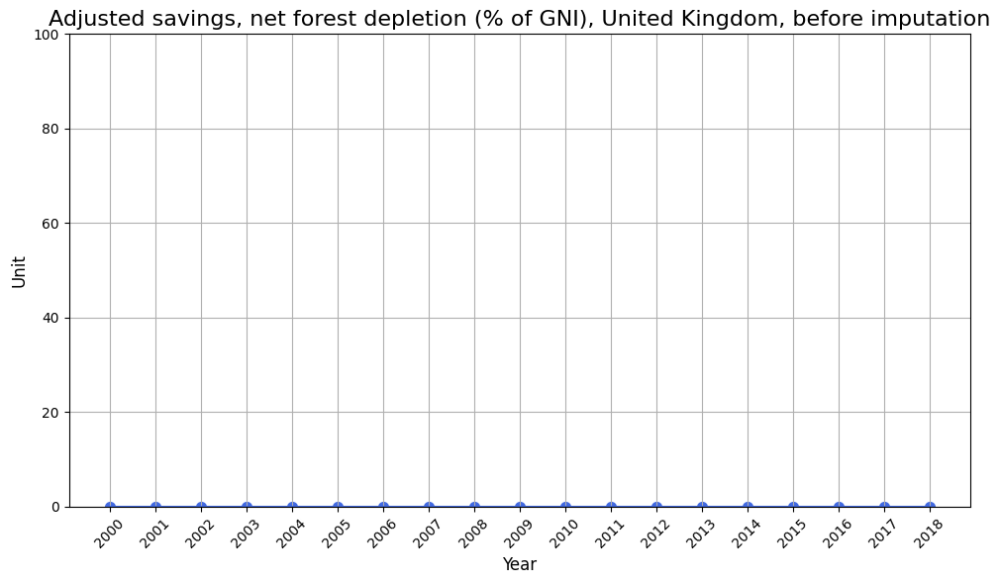

In [66]:
# Filtrer les données
pays = "United Kingdom"
indicateur = "Adjusted savings, net forest depletion (% of GNI)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, before imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()

In [67]:
mask = ESG_df_ByInd['Country Name'] == "United Kingdom"
col = "Adjusted savings, net forest depletion (% of GNI)"

ESG_df_ByInd.loc[mask, col] = ESG_df_ByInd.loc[mask, col].fillna(0.0)
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "United Kingdom"]["Adjusted savings, net forest depletion (% of GNI)"]

,"Adjusted savings, net forest depletion (% of GNI)"
4025,0.0
4026,0.0
4027,0.0
4028,0.0
4029,0.0
4030,0.0
4031,0.0
4032,0.0
4033,0.0
4034,0.0


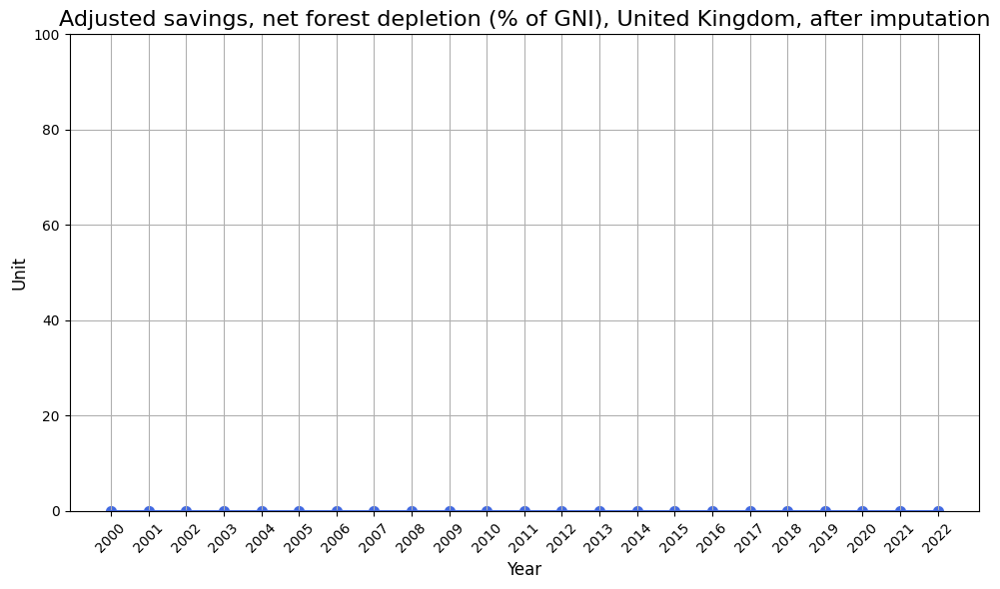

In [68]:
# Filtrer les données
pays = "United Kingdom"
indicateur = "Adjusted savings, net forest depletion (% of GNI)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, after imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()

Pour les cas suivant on a peu d'informations mais comme l'emplacement des valeurs est différentes on va considérer qu'on se situe sous le méchanisme MAR (Missing At Random). On va donc travailler en MI (Multiple Imputation) et MCMC(Markov Chain Monte Carlo), on utilise le package (Multiple Imputation by Chained Equations) miceforest est une librairie très fidèle à la méthode MI (utilise des forêts aléatoires). On considère que les pays sont indépendant entre eux et on va donc utiliser uniquement les données de chacun et imputer de leur côté. (Possible d'utiliser les données des autres pays si je pense qu'il y a une corrélation entre eux, genre pays européens ont les même valeur, mais pour ce qui est des forêt j'ai pas l'expertise du tout et je pense que c'est variable)

In [69]:
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Tajikistan"]["Adjusted savings, net forest depletion (% of GNI)"]

,"Adjusted savings, net forest depletion (% of GNI)"
3726,NaN
3727,NaN
3728,NaN
3729,NaN
3730,0.0000
3731,0.0183
3732,0.0000
3733,0.0000
3734,0.0000
3735,0.0000


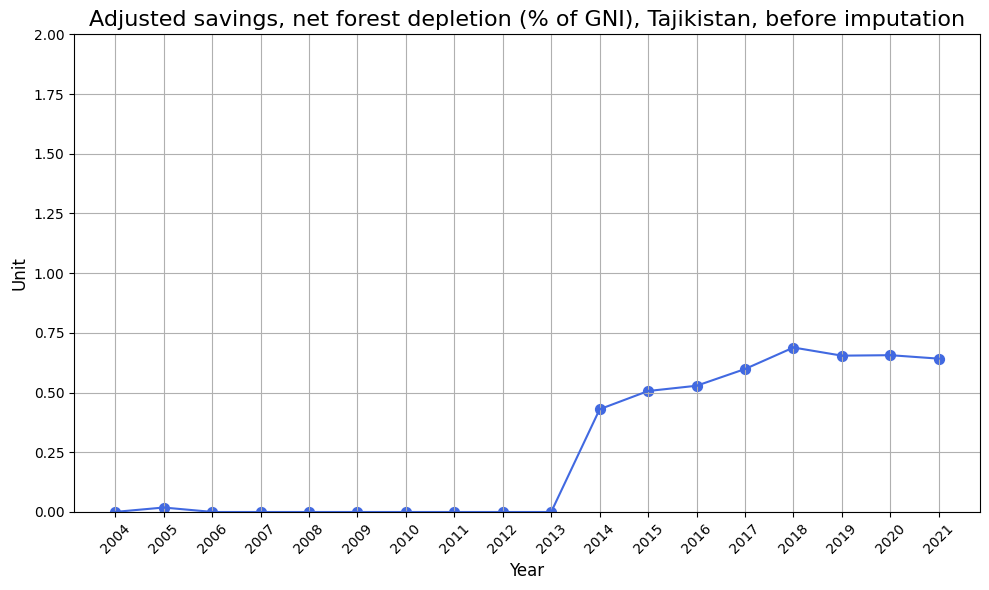

In [70]:
# Filtrer les données
pays = "Tajikistan"
indicateur = "Adjusted savings, net forest depletion (% of GNI)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, before imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 2)
plt.grid(True)
plt.tight_layout()
plt.show()

In [71]:
mask = ESG_df_ByInd['Country Name'] == "Tajikistan"
col = "Adjusted savings, net forest depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Tajikistan"]["Adjusted savings, net forest depletion (% of GNI)"]

,"Adjusted savings, net forest depletion (% of GNI)"
3726,0.0000
3727,0.0000
3728,0.0000
3729,0.0000
3730,0.0000
3731,0.0183
3732,0.0000
3733,0.0000
3734,0.0000
3735,0.0000


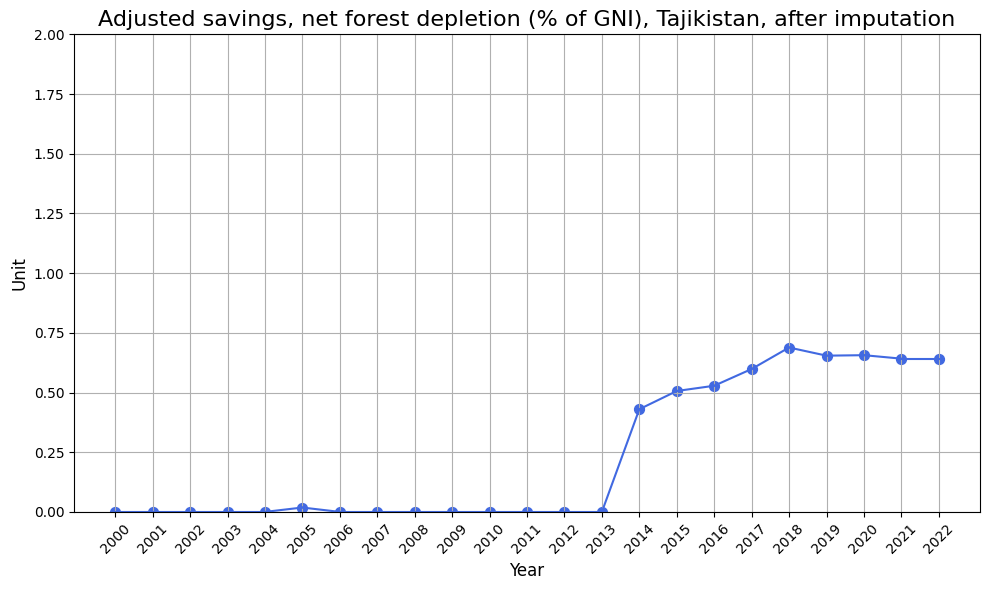

In [72]:
# Filtrer les données
pays = "Tajikistan"
indicateur = "Adjusted savings, net forest depletion (% of GNI)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, after imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 2)
plt.grid(True)
plt.tight_layout()
plt.show()

### Adjusted savings, natural resources depletion (% of GNI)

In [73]:
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Tajikistan"]["Adjusted savings, natural resources depletion (% of GNI)"]

,"Adjusted savings, natural resources depletion (% of GNI)"
3726,NaN
3727,NaN
3728,NaN
3729,NaN
3730,0.3217
3731,0.2426
3732,0.3324
3733,0.2892
3734,0.2570
3735,0.2872


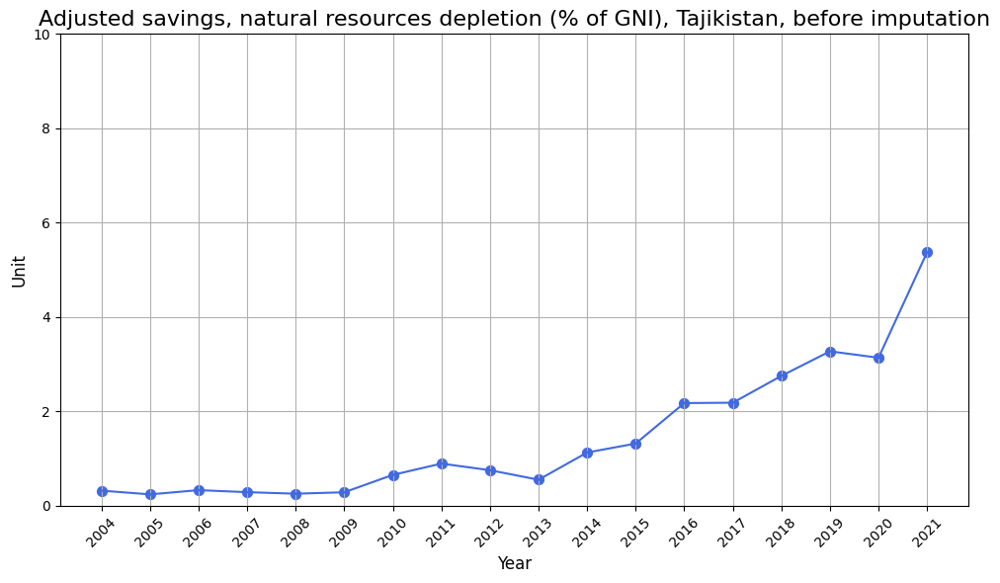

In [74]:
# Filtrer les données
pays = "Tajikistan"
indicateur = "Adjusted savings, natural resources depletion (% of GNI)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, before imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 10)
plt.grid(True)
plt.tight_layout()
plt.show()

In [75]:
mask = ESG_df_ByInd['Country Name'] == "Tajikistan"
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "Tajikistan"]["Adjusted savings, natural resources depletion (% of GNI)"]

,"Adjusted savings, natural resources depletion (% of GNI)"
3726,0.2570
3727,0.2892
3728,0.3217
3729,0.2570
3730,0.3217
3731,0.2426
3732,0.3324
3733,0.2892
3734,0.2570
3735,0.2872


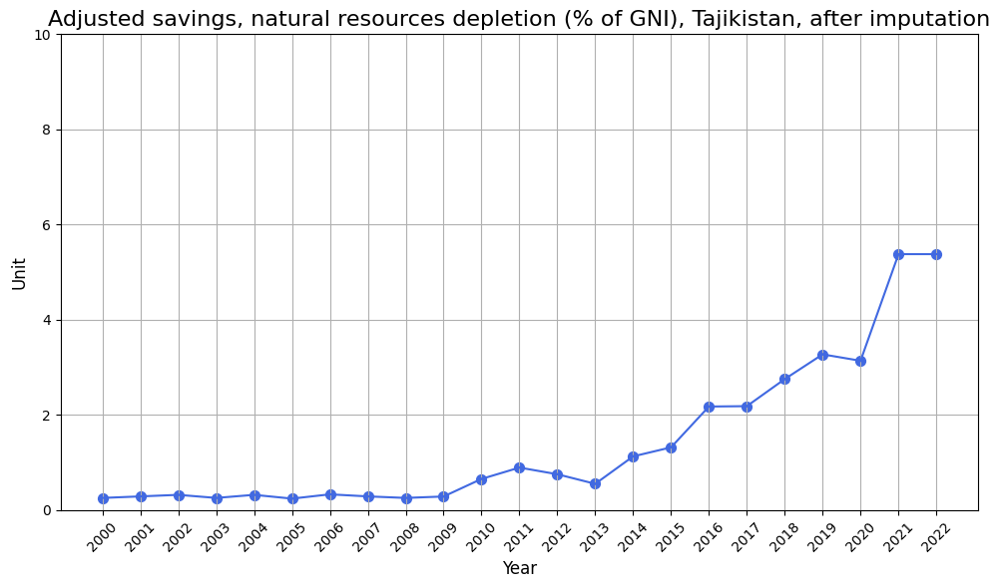

In [76]:
# Filtrer les données
pays = "Tajikistan"
indicateur = "Adjusted savings, natural resources depletion (% of GNI)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, after imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 10)
plt.grid(True)
plt.tight_layout()
plt.show()

In [77]:
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "United Kingdom"]["Adjusted savings, natural resources depletion (% of GNI)"]

,"Adjusted savings, natural resources depletion (% of GNI)"
4025,0.9563
4026,0.8419
4027,0.7277
4028,0.6812
4029,0.6600
4030,0.7425
4031,0.8209
4032,0.7761
4033,1.2270
4034,0.7758


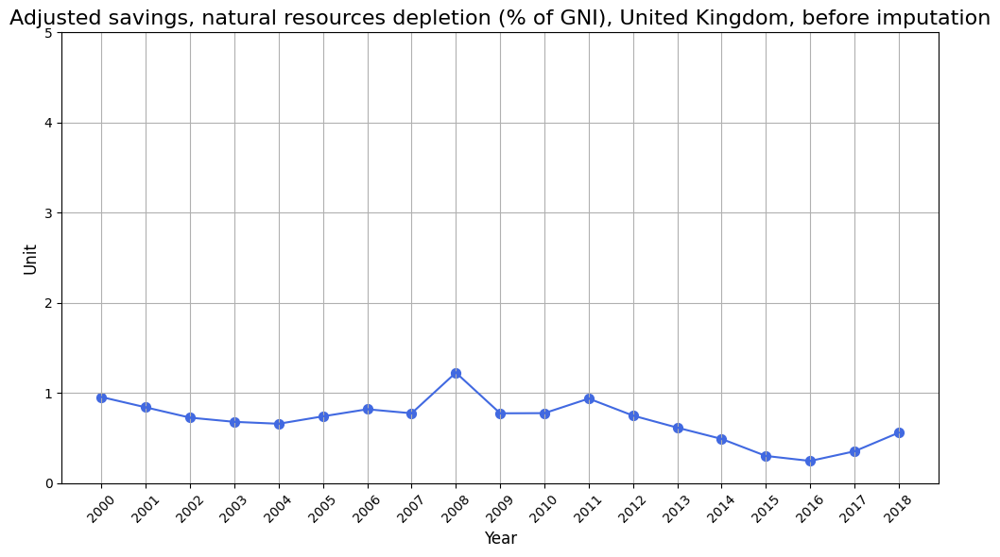

In [78]:
# Filtrer les données
pays = "United Kingdom"
indicateur = "Adjusted savings, natural resources depletion (% of GNI)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, before imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 5)
plt.grid(True)
plt.tight_layout()
plt.show()

In [79]:
mask = ESG_df_ByInd['Country Name'] == "United Kingdom"
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values
ESG_df_ByInd[ESG_df_ByInd['Country Name']== "United Kingdom"]["Adjusted savings, natural resources depletion (% of GNI)"]

,"Adjusted savings, natural resources depletion (% of GNI)"
4025,0.9563
4026,0.8419
4027,0.7277
4028,0.6812
4029,0.6600
4030,0.7425
4031,0.8209
4032,0.7761
4033,1.2270
4034,0.7758


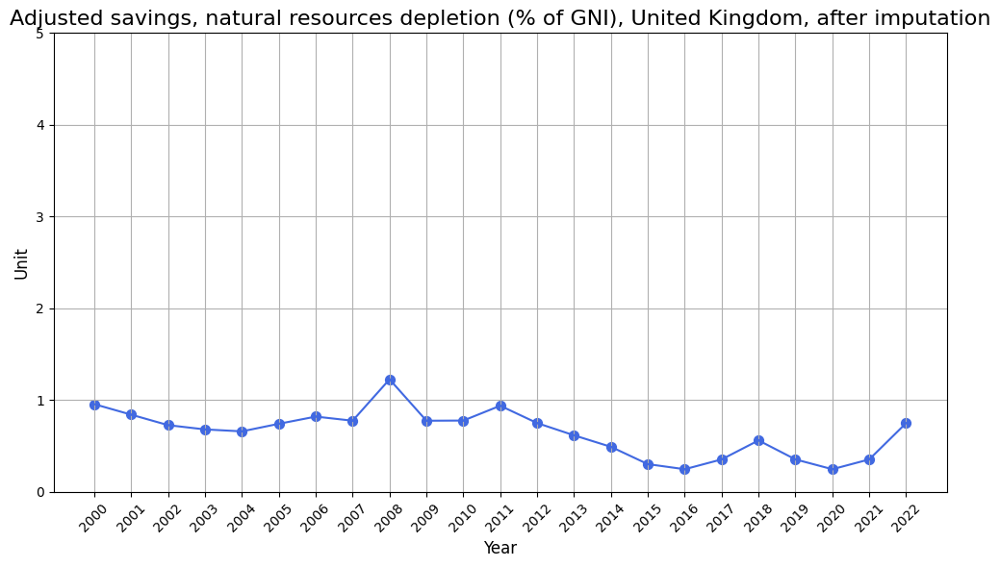

In [80]:
# Filtrer les données
pays = "United Kingdom"
indicateur = "Adjusted savings, natural resources depletion (% of GNI)"

df = ESG_df_ByInd[ESG_df_ByInd['Country Name'] == pays][
    ["Year", indicateur]
].reset_index(drop=True)

plt.figure(figsize=(10,6))

# --- Tracer les points uniquement ---
plt.scatter(
    df["Year"],
    df[indicateur],
    color="royalblue",
    s=50
)

# --- Tracer des segments seulement entre points valides ---
for i in range(len(df)-1):
    y0 = df.loc[i, indicateur]
    y1 = df.loc[i+1, indicateur]
    if pd.notna(y0) and pd.notna(y1):
        plt.plot(
            [df.loc[i, "Year"], df.loc[i+1, "Year"]],
            [y0, y1],
            color="royalblue"
        )

plt.title(f"{indicateur}, {pays}, after imputation", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Unit", fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 5)
plt.grid(True)
plt.tight_layout()
plt.show()

In [81]:
# Compute le % de valeur présente pour chaque paire indicateur/pays
missing_data = ESG_df_ByInd.drop(columns=["Year"]).groupby("Country Name").count().reset_index()
cols = missing_data.columns[1:]
missing_data[cols] = missing_data[cols]/nb_years*100

# Récuperer les données à moins de 100% -> (à completer)
mask = missing_data.drop(columns=["Country Name"]).lt(100)
rows, cols = np.where(mask)

# Construire un DataFrame avec les résultats
missing_data = pd.DataFrame({
    "Country Name": missing_data.iloc[rows]["Country Name"].values,
    "Indicator Name": mask.columns[cols],
    "Value": missing_data.drop(columns=["Country Name"]).values[rows, cols]
})
missing_data.groupby(['Value']).count()

,Country Name,Indicator Name
Value,,


## Missing data by Year

In [82]:
# updtate the other formats
ESG_df_long = pd.melt(ESG_df_ByInd, id_vars=['Country Name', 'Year'], var_name='Indicator Name', value_name='Value')

ESG_df = ESG_df_long.pivot_table(
    index=['Country Name', 'Indicator Name'],
    columns='Year',
    values='Value'
).reset_index()

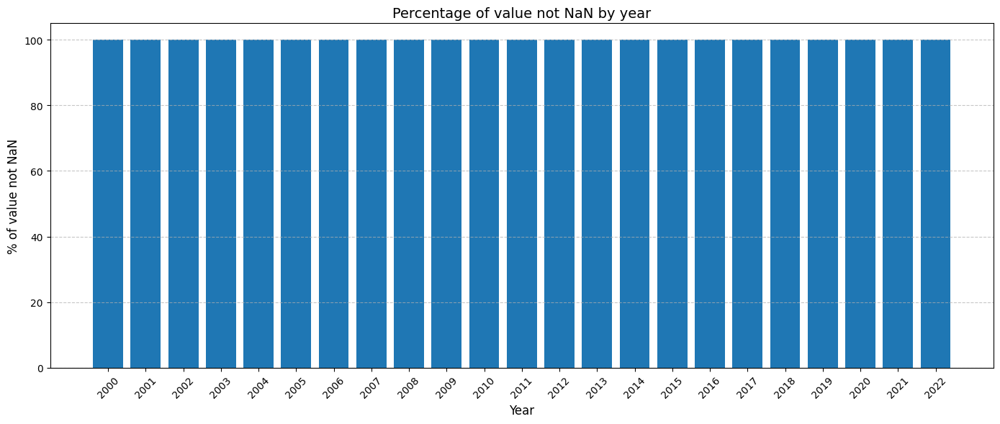

In [83]:
# Number maximal of data by Year (19260)
nb_data_by_year = nb_countries*nb_indicators

# Compute % of data
df_year = ESG_df.drop(columns=["Country Name","Indicator Name"]).notna().sum()/nb_data_by_year*100

# Show the repartition
plt.figure(figsize=(14, 6))
plt.bar(df_year.index, df_year.values)
plt.title("Percentage of value not NaN by year", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Missing data by Indicator

/tmp/ipython-input-3771822346.py:23: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


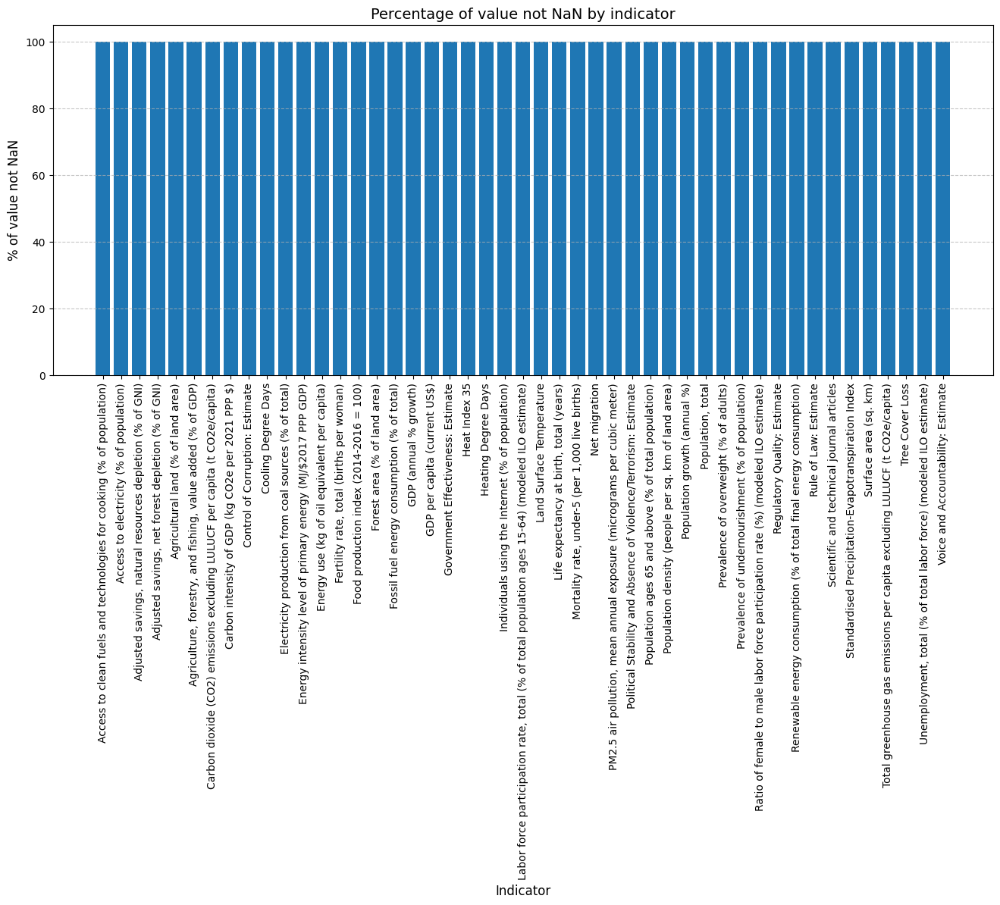

In [84]:
# Number maximal of data by Indicator (13910)
nb_data_by_indicator = nb_countries*nb_years

# Put the indicators in columns
df_ind = ESG_df_long.pivot_table(
    index=['Country Name', 'Year'],
    columns='Indicator Name',
    values='Value'
).reset_index()

# Compute % of data
df_ind = df_ind.drop(columns=["Country Name","Year"]).notna().sum()/nb_data_by_indicator*100
df_ind.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(16, 6))
plt.bar(df_ind.index, df_ind.values)
plt.title("Percentage of value not NaN by indicator", fontsize=14)
plt.xlabel("Indicator", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90,ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Missing data by Country

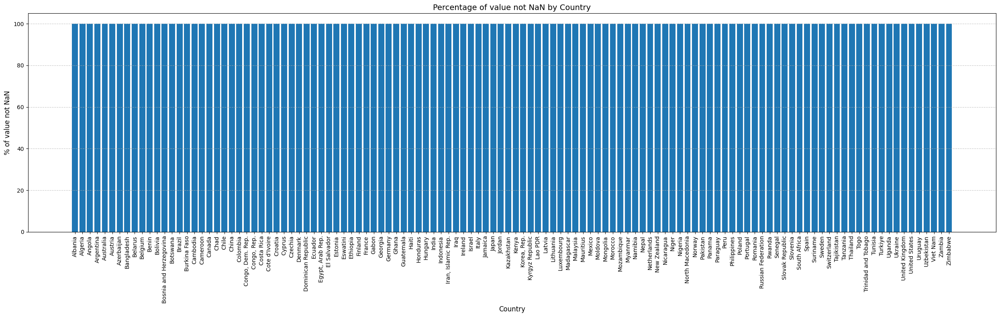

In [85]:
# Number maximal of data by Country (5850)
nb_data_by_country = nb_indicators*nb_years

# Put the Countries in columns
df_countries = ESG_df_long.pivot_table(
    index=['Indicator Name', 'Year'],
    columns='Country Name',
    values='Value'
).reset_index()

# Compute % of data
df_countries = df_countries.drop(columns=["Year","Indicator Name"]).notna().sum()/nb_data_by_country*100
df_countries.sort_values(ascending=False, inplace=True)

# Show the repartition
plt.figure(figsize=(25, 8))
plt.bar(df_countries.index, df_countries.values)
plt.title("Percentage of value not NaN by Country", fontsize=14)
plt.xlabel("Country", fontsize=12)
plt.ylabel("% of value not NaN", fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [86]:
print(nb_data_by_year)
print(nb_data_by_indicator)
print(nb_data_by_country)

5546
2714
1081


In [87]:
 # % de valeurs manquantes sur l'ensemble du dataset

(ESG_df_ByInd.drop(columns=["Country Name","Year"]).count()/ESG_df_ByInd.shape[0]*100).mean()

np.float64(100.0)

# Handling Outliers

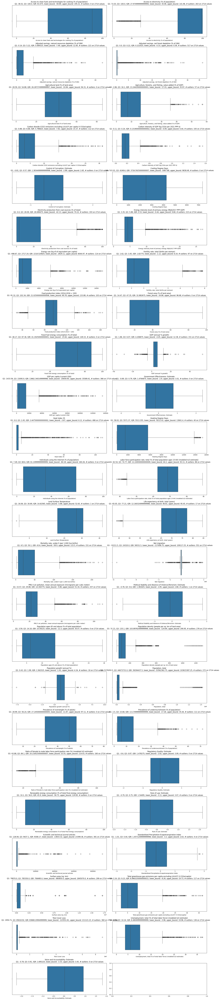

In [88]:
fig, axs = plt.subplots(24, 2, figsize=(20, 100))
axs = axs.flatten()

for column,ax in zip(ESG_df_ByInd.columns.drop(["Country Name","Year"]),axs):

  column_data = ESG_df_ByInd[column].dropna()

  Q1 = np.percentile(column_data, 25)
  Q3 = np.percentile(column_data, 75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  outliers = [x for x in column_data if x < lower_bound or x > upper_bound]

  sns.boxplot(x=column, data=ESG_df_ByInd, ax=ax)
  ax.set_title(f'{column} \n Q1: {np.round(Q1,2)}, Q3: {np.round(Q3,2)}, IQR: {IQR}, lower_bound: {np.round(lower_bound,2)}, upper_bound: {np.round(upper_bound,2)}, # outliers: {len(outliers)} on {nb_data_by_indicator} values')

plt.tight_layout()
plt.show()

## Verification of outliers

Les valeurs proche de 0 ont également été vérifiées

* Access to clean fuels and technologies for cooking (% of population)

No outliers

* Access to electricity (% of population)

335 outliers, concernant les pays suivant :

['Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Cambodia', 'Chad',
       'Congo, Dem. Rep.', 'Congo, Rep.', 'Eswatini', 'Ethiopia', 'Kenya',
       'Madagascar', 'Mozambique', 'Nepal', 'Niger', 'Rwanda', 'Tanzania',
       'Togo', 'Uganda', 'Zambia']

Pas de valeurs complètemement aberrantes à première vue (on reste au dessus de 0%) De manière générale les valeurs sont du même ordre pour chaque pays et entre les années. Les outliers sont en général des pays peu développés

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/share-of-the-population-with-access-to-electricity
* https://trackingsdg7.esmap.org/

Cas problématiques :

Nope !

* Adjusted savings, natural resources depletion (% of GNI)

(A noter que cet indicateur varie en fonction des valeurs d'exportations des resources et du GNI du pays, les valeurs d'exp peuvent parfois augmenter ou baisser fortement et le GNI varier en cas de crise)

221 outliers, concernant les pays suivant :

['Algeria', 'Angola', 'Azerbaijan', 'Burkina Faso', 'Chad', 'Chile',
       'Congo, Dem. Rep.', 'Congo, Rep.', 'Ecuador', 'Ethiopia', 'Gabon',
       'Ghana', 'Iraq', 'Kazakhstan', 'Kyrgyz Republic', 'Mongolia',
       'Myanmar', 'Nigeria', 'Peru', 'Russian Federation', 'Suriname',
       'Togo', 'Trinidad and Tobago', 'Uganda', 'Uzbekistan', 'Zambia',
       'Zimbabwe']

Pas de valeurs complètemement aberrantes à première vue (selon l'unité % of GNI). Variation assez importante des données selon les années (peut être expliqué par la variation des prix des resources sur l'année et des exploitations des pays.

De manière générale les valeurs sont du même ordre pour chaque pays et entre les années (malgré quelques pics). En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://www.indexmundi.com/facts/indicators/NY.ADJ.DRES.GN.ZS/
* https://www.ceicdata.com/en/bahrain/environmental-land-use-protected-areas-and-national-wealth/bh-adjusted-savings-natural-resources-depletion--of-gni)

Quelques cas ou il y a un doute mais pas l'expertise pour vérifier et souvent post covid on les garde et on précisera le doute -> à eliminer potentiellement si trop de problème pour la régression.

Quelques cas ou il y a un doute  :

Les pics arrivent souvent en 2021 et 2022, possiblement du à un changement de méthodo, ou peut être le post covid. La plupart des pays montrent ce pic dans une moindre mesure. Le 2022 est en fait l'imputation qui accentue le pic (aussi expliqué par le fait que l'ind est super variable), on manque de données pour expliquer ce pic, possible post covid, on va changer la méthode d'imputation pour atténuer ce pic qu'on a créé -> normalement peu d'impact sur les biais car moins de 5% de la série

Burkina Faso, gros pic en 2021 et 2022, changement méthodo ? corrigé

Chili, pic 2021, 2022 corrigé

Kazakhstan idem  corrigé

Kyrgyz Republic pareil corrigé

Peru pareil corrigé

Russian Federation pareil corrigé

Myanmar, Les valeurs de CEIC et Index mundi 2 à 3 fois plus basses mais gardent la même forme, ChatGPT trouve pas ça choquant, non corrigé

Zambia *4 en 2021 un peu chelou même avec rebond covid mais pas d'autres données pour vérifier -> applatir cette valeur ? peut être pas dû à un contexte précis flambé des prix cuivre + grosse prod + recul GNI corrigé

Zimbabwe le pic 2007-2008 est un peu vénère probable distortion due à la crise économique hardcore à aplatir ? non corrigé

* Adjusted savings, net forest depletion (% of GNI)

(A noter que cet indicateur varie en fonction des valeurs d'exportations des resources et du GNI du pays, les valeurs d'exp peuvent parfois augmenter ou baisser fortement et le GNI varier en cas de crise)

517 outliers, concernant les pays suivant :

['Angola', 'Benin', 'Bosnia and Herzegovina', 'Cameroon', 'Chad',
       'Congo, Dem. Rep.', 'Congo, Rep.', 'El Salvador', 'Eswatini',
       'Ethiopia', 'Gabon', 'Ghana', 'Haiti', 'Honduras', 'Kenya',
       'Lao PDR', 'Lithuania', 'Madagascar', 'Malaysia', 'Mozambique',
       'Myanmar', 'Namibia', 'Nepal', 'Paraguay', 'Rwanda', 'Suriname',
       'Tajikistan', 'Togo', 'Uganda', 'Zambia', 'Zimbabwe']

Pas de valeurs complètemement aberrantes à première vue (selon l'unité % of GNI), on reste à moins de 40%. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années, et restent assez basses et proche de la moyenne.

 En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://www.indexmundi.com/facts/indicators/NY.ADJ.DFOR.GN.ZS/
* https://www.ceicdata.com

Cas problématique :

Bénin, tout à 0 à partir de 2003 parait étrange alors que j'ai vérifié il y a de la deforestation (forest loss) donc à passer en NaN (probable manque de données) -> Attention forest loss concernent pas forcément deforestation, peut être naturel (incendie) -> forest watch quasiment pas de perte de foret (primaire) -> On va considérer que c'est un choix de worldBank et que la déforestation est négligeable, pas de correction

Congo Dem Rep
Pics très élévés en 2003 mais cohérent avec natural resources depletion, chiffres incohérents avec index mundi -> forest watch grosse perte de foret
pas de correction

Honduras 0 à partir de 2011, étrange surtout qu'on retrouve de la deforestation donc à passer en NaN (probable manque de données) -> compléter index mundi maybe ? -> à prendre en compte beaucoup de pays sont en fait à zéro possible choix méthodo de worldbank de dire que les valeurs sont négligeable -> forest watch encore de l'exploitation apparemment, pas de correction

Myanmar plus élevé que les autres sources (*2-*3) mais chat pas chockbar, pas de correction

Zambia passage à 0 en 2011, un peu bizarre car encore de l'exploitation d'après forest watch, pas de correction

Zimbabwe -> hyperinflation créé un énorme pic en 2007-2008, pas réellement d'exploitation supérieure juste le GNI c'est cassé la geule, pas de correction

* Agricultural land (% of land area)

No outliers

* Agriculture, forestry, and fishing, value added (% of GDP)

57 outliers, concernant les pays suivant :

['Chad', 'Ethiopia', 'Ghana', 'Myanmar', 'Nepal', 'Niger',
       'Nigeria']

Pas de valeurs complètemement aberrantes à première vue (selon l'unité % of GDP), on reste à moins de 60%. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années. Sont souvent des pays très dépendant de l'agriculture et/ou la pêche

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://www.mydatajungle.com/en/indicators/?internal=0&field_req=&layout=&cat=20&indicator=75&country=99&period=1A&source=16&other_countries=&from=1997-12-01&to=2019-12-01&type=line&sort=&btn_applica=Search
* https://ourworldindata.org/grapher/agriculture-share-gdp?tab=line&country=~BDI&mapSelect=~BDI

Cas problématique :

0

* Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita)

112 outliers, concernant les pays suivant :

['Australia', 'Canada', 'Estonia', 'Kazakhstan', 'Luxembourg',
       'Trinidad and Tobago', 'United States']

Valeurs assez importantes > 20 t/capita mais techniquement possible, pas forcément aberrant pour des pays gros consommateurs de pétrole et de gaz et ou l'energie est très carbonnée et à faible pop. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/co-emissions-per-capita?country=~AUSfrom=1997-12-01&to=2019-12-01&type=line&sort=&btn_applica=Search
* https://edgar.jrc.ec.europa.eu/report_2022?vis=pop#emissions_table

Cas problématique :

* Carbon intensity of GDP (kg CO2e per 2021 PPP $)

193 outliers, concernant les pays suivant :


['Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'China',
       'Estonia', 'Iran, Islamic Rep.', 'Iraq', 'Kazakhstan', 'Mongolia',
       'Poland', 'Russian Federation', 'South Africa',
       'Trinidad and Tobago', 'Ukraine', 'Uzbekistan']

['Azerbaijan', 'Bahrain', 'Belarus', 'Bosnia and Herzegovina',
       'Bulgaria', 'China', 'Estonia', 'Iran, Islamic Rep.', 'Kazakhstan',
       'Kuwait', 'Libya', 'Mongolia', 'Oman', 'Qatar',
       'Russian Federation', 'Seychelles', 'South Africa',
       'Trinidad and Tobago', 'Turkmenistan', 'Ukraine', 'Uzbekistan']

De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://kidb.adb.org/go/sdg-9-4-1-co2-emission-per-unit-of-gdp
* https://ourworldindata.org/grapher/co2-intensity?tab=line&time=2000..latest&country=AZE~BHR
(celui là pas exactement pareil mais pour avoir une idée)

Cas problématique :

* Control of Corruption: Estimate

No outliers

* Cooling Degree Days

No outliers

* Electricity production from coal sources (% of total)

193 outliers, concernant les pays suivant :

['Australia', 'Bosnia and Herzegovina', 'Botswana', 'China',
       'Czechia', 'Estonia', 'India', 'Israel', 'Kazakhstan', 'Mongolia',
       'Morocco', 'Niger', 'North Macedonia', 'Poland', 'South Africa']

Les valeurs ne dépassent pas 100% cohérent, outliers représentent pays encore dépendant au charbon.

De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/share-electricity-coal

Cas problématique :
Aucun lessgo

* Energy intensity level of primary energy (MJ/$2017 PPP GDP)

215 outliers, concernant les pays suivant :

['Azerbaijan', 'Belarus', 'China', 'Congo, Dem. Rep.', 'Ethiopia',
       'Iraq', 'Kazakhstan', 'Mozambique', 'Myanmar', 'Nigeria',
       'Russian Federation', 'Tajikistan', 'Tanzania', 'Togo',
       'Trinidad and Tobago', 'Uganda', 'Ukraine', 'Uzbekistan', 'Zambia',
       'Zimbabwe']

Des valeurs assez élevées (jusqu'à +25 MJ). EN général des pays en developpement avec efficacité energétique à chier. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://w3.unece.org/SDG/en/Indicator?id=24 (PPP 2011)
* https://ourworldindata.org/grapher/energy-intensity-of-economies (PPP jsp)

Cas problématique :

0 wouhou

* Energy use (kg of oil equivalent per capita)

144 outliers, concernant les pays suivant :

'Canada', 'Finland', 'Luxembourg', 'Norway', 'Trinidad and Tobago',
       'United States']

Des valeurs assez élevées (jusqu'à + de 14000 kg). Pays gros consommateurs et/ou à faible efficacité energétique. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://worlddataview.com/topics/environment/energy_use_kg_of_oil_equivalent_per_capita

Cas problématique :

0 wouhou

* Fertility rate, total (births per woman)

97 outliers, concernant les pays suivant :

['Angola', 'Burkina Faso', 'Chad', 'Congo, Dem. Rep.', 'Ethiopia',
       'Niger', 'Uganda']

['Afghanistan', 'Chad', 'Niger', 'Somalia']

Des valeurs raisonnables seulement un peu au dessus de l'upper_bound mais à moins de 8 births. En général pays pauvres à forte natalité (qui décroit avec le temps). De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/children-born-per-woman

Cas problématique :

0 wouhou

* Food production index (2014-2016 = 100)

103 outliers, concernant les pays suivant :

['Algeria', 'Angola', 'Burkina Faso', 'Cambodia', 'Cameroon',
       'Chad', 'Congo, Dem. Rep.', 'Cyprus', 'Ethiopia', 'Georgia',
       'Ghana', 'Iraq', 'Jordan', 'Lao PDR', 'Mongolia', 'Mozambique',
       'Niger', 'Paraguay', 'Senegal', 'Tajikistan', 'Tanzania',
       'Trinidad and Tobago', 'Uganda', 'Uzbekistan', 'Zambia']

Des valeurs assez élévée (jusqu'à 180% de la valeur de référence 2014-2016), possible pour des pays gros producteur, et également plus faible (environ 40%) potentiellement des valeurs précedentes à 2014-2016 pour des pays en développement qui avaient encore une faible prod. Fluctuation possible pour pays avec climat difficile (saheliens) ou très bonne années ou economie petite (forte variation en cas de pb). De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo
* https://data.worldbank.org/indicator/

Cas problématique :

Angola creux en 2012 un peu bizarre mais why not, pas de correction

Chad pic 2010 mais possible si bonne année, pas de correction

Congo, Dem. Rep. énorme saut en 2010 surement rev de méthodo, pas de correction

Iraq assez grosses var, mais moyenne correcte, pas de correction

Senegal valeurs extrêmes mais pourquoi pas, pas de correction

En général les creux du à des mauvaises années et progression constante

* Forest area (% of land area)

No outliers

* Fossil fuel energy consumption (% of total)

No outliers

* GDP (annual % growth)

151 outliers, concernant les pays suivant :

['Algeria', 'Angola', 'Argentina', 'Austria', 'Azerbaijan',
       'Belarus', 'Belgium', 'Bolivia', 'Botswana', 'Cambodia', 'Canada',
       'Chad', 'Chile', 'China', 'Colombia', 'Congo, Dem. Rep.',
       'Congo, Rep.', "Cote d'Ivoire", 'Croatia', 'Cyprus', 'Czechia',
       'Denmark', 'Dominican Republic', 'Ecuador', 'El Salvador',
       'Estonia', 'Ethiopia', 'Finland', 'France', 'Georgia', 'Germany',
       'Ghana', 'Haiti', 'Honduras', 'Hungary', 'India', 'Iraq',
       'Ireland', 'Italy', 'Jamaica', 'Japan', 'Kazakhstan',
       'Kyrgyz Republic', 'Latvia', 'Lithuania', 'Madagascar', 'Malaysia',
       'Mauritius', 'Mexico', 'Moldova', 'Mongolia', 'Morocco',
       'Mozambique', 'Myanmar', 'Namibia', 'Nigeria', 'North Macedonia',
       'Panama', 'Peru', 'Philippines', 'Portugal', 'Romania',
       'Russian Federation', 'Rwanda', 'Slovak Republic', 'Slovenia',
       'South Africa', 'Spain', 'Suriname', 'Thailand', 'Togo',
       'Trinidad and Tobago', 'Tunisia', 'Turkiye', 'Ukraine',
       'United Kingdom', 'Uruguay', 'Zimbabwe']

Des valeurs assez variables (de -40% à +40%) du au type d'indicateur très variable. Correspondent souvent à des crises financières ou guerre, ou arrêts de celles ci. L'année 2020 est aussi en général une période de gros creux. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://www.imf.org/external/datamapper/NGDP_RPCH@WEO/AFG/AUS

Cas problématique :

None

* GDP per capita (current US$)

336 outliers, concernant les pays suivant :

['Australia', 'Austria', 'Belgium', 'Canada', 'Denmark', 'Finland',
       'France', 'Germany', 'Ireland', 'Israel', 'Italy', 'Japan',
       'Luxembourg', 'Netherlands', 'New Zealand', 'Norway', 'Spain',
       'Sweden', 'Switzerland', 'United Kingdom', 'United States']

Des valeurs assez extrêmes (120.000 $), concernent pays à très haut revenus. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://www.imf.org/external/datamapper/NGDPDPC@WEO/USA/DEU

Cas problématique :

None

* Government Effectiveness: Estimate

No outliers

* Heat Index 35

486 outliers, concernant les pays suivant :

['Algeria', 'Australia', 'Bangladesh', 'Benin', 'Burkina Faso',
       'Cambodia', 'Chad', 'China', 'Colombia', "Cote d'Ivoire", 'Cyprus',
       'Egypt, Arab Rep.', 'Ghana', 'Guatemala', 'India',
       'Iran, Islamic Rep.', 'Iraq', 'Kenya', 'Korea, Rep.', 'Lao PDR',
       'Mexico', 'Myanmar', 'Nepal', 'Niger', 'Nigeria', 'Pakistan',
       'Paraguay', 'Philippines', 'Senegal', 'Thailand', 'Togo',
       'Tunisia', 'Viet Nam']

Pas de valeurs aberrantes à première vue (>365 jours). Pays Chauds logique + rechauffement climatique. Des pics assez irréguliers, pas trop possible de vérifier. Interressant de regarder la corrélation au niveau du monde. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/

Cas problématique :

Pas pu vérifier

* Heating Degree Days

Demande energétique en chauffage

40 outliers, concernant les pays suivant :

['Canada', 'Russian Federation']

Des grosses différences de valeur mais concernent exclusivement ces deux pays. Pas surprenant car pays froid et de manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/

Cas problématique :

None

* Individuals using the Internet (% of population)

No Outliers

* Labor force participation rate, total (% of total population ages 15-64) (modeled ILO estimate)

86 outliers, concernant les pays suivant :

['Algeria', 'Egypt, Arab Rep.', 'Iran, Islamic Rep.', 'Iraq',
       'Jordan', 'Nepal', 'Tajikistan']

Pas de valeurs aberrantes à première vue (tout >35%). En général pays avec beaucoup de travail informel, de chomage structurel ou pays ou les femmes ne participent pas à l'économie. De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://rshiny.ilo.org/dataexplorer68/?lang=en&segment=indicator&id=EAP_2WAP_SEX_AGE_RT_A

Cas problématique :

None

* Land Surface Temperature

1 outliers, concernant les pays suivant :

['Russian Federation']

De manière générale les valeurs sont du même ordre pour ce pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/

Cas problématique :

Pas d'autres données mais russie me semble ok

* Life expectancy at birth, total (years)

17 outliers, concernant les pays suivant :

['Angola', 'Eswatini', 'Haiti', 'Zambia', 'Zimbabwe']

Valeurs très basses quand même. Possiblement des pays en guerre ou très pauvre. De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://data.who.int/indicators/i/A21CFC2/90E2E48

Cas problématique :

Haiti, gros creux 2010 mais visible sur who aussi -> Seisme de fou furieux 200 000 morts au moins

* Mortality rate, under-5 (per 1,000 live births)

151 outliers, concernant les pays suivant :

['Angola', 'Benin', 'Burkina Faso', 'Cameroon', 'Chad',
       'Congo, Dem. Rep.', "Cote d'Ivoire", 'Eswatini', 'Ethiopia',
       'Haiti', 'Mozambique', 'Niger', 'Nigeria', 'Rwanda', 'Senegal',
       'Tanzania', 'Togo', 'Uganda', 'Zambia']

Valeurs assez élévées (jusqu'à 270 morts / 1000) mais possibles. Possiblement des pays en guerre ou très pauvre, en général les valeurs sont élevées en 2000 et décroissent au fur du temps. De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://childmortality.org/all-cause-mortality/data?refArea=CAF&methodType=childmortality

Cas problématique :

Nope

* Net migration :

551 outliers, concernant les pays suivant :

['Angola', 'Australia', 'Austria', 'Bangladesh', 'Belgium',
       'Brazil', 'Canada', 'Chad', 'Chile', 'China', 'Colombia',
       'Congo, Dem. Rep.', "Cote d'Ivoire", 'Czechia', 'Egypt, Arab Rep.',
       'Ethiopia', 'France', 'Georgia', 'Germany', 'India',
       'Iran, Islamic Rep.', 'Iraq', 'Italy', 'Japan', 'Jordan',
       'Korea, Rep.', 'Malaysia', 'Mexico', 'Myanmar', 'Nepal',
       'Netherlands', 'Pakistan', 'Peru', 'Philippines', 'Poland',
       'Romania', 'Russian Federation', 'Rwanda', 'South Africa', 'Spain',
       'Sweden', 'Tanzania', 'Thailand', 'Turkiye', 'Uganda', 'Ukraine',
       'United Kingdom', 'United States', 'Viet Nam', 'Zimbabwe']

Valeurs très différentes (plusieurs centaines de milliers). Des pays à très forte migration (entrante ou sortante) on note des pics concernant des vagues de migration possible guerres ou crises. On observe une grosse chute en 2020 (Covid). De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://www.migrationdataportal.org/dashboard/compare-geographic?c=116&i=9746&r=&s=&t=2000_2022

Cas problématique :

Cambodia, et Jamaica à 0 en 2020, pourrait s'expliquer par la fermeture des frontière du covid, une migration faible de base et un manque de données (pas non plus dispo sur l'autre source)

Mongolia à 0 à partir de 2020, reste comme ça jusqu'en 2024, mais sur les sites de la CIA et celui là on a bien des valeurs, on va les reprendre
https://www.globaldata.com/data-insights/macroeconomic/the-net-migration-in-mongolia-382604/
https://www.cia.gov/the-world-factbook/about/archives/2022/field/net-migration-rate/

* PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)

257 outliers, concernant les pays suivant :

['Bangladesh', 'Benin', 'Bolivia', 'Burkina Faso', 'Cameroon',
       'Chad', 'China', "Cote d'Ivoire", 'Egypt, Arab Rep.', 'Ghana',
       'India', 'Nepal', 'Niger', 'Nigeria', 'Pakistan', 'Peru',
       'Senegal', 'Tajikistan', 'Togo']

Pays industriels. Pic général en 2015 (crise env au sahel askip). De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/average-exposure-pm25-pollution

Cas problématique :

* Political Stability and Absence of Violence/Terrorism: Estimate

1 outliers, concernant les pays suivant :

['Iraq']

La valeur fait suite à l'invasion de l'iraq par les USA (les valeurs étaient déjà basse)

* Population ages 65 and above (% of total population)

No outlier

* Population density (people per sq. km of land area)

276 outliers, concernant les pays suivant :

['Bangladesh', 'Belgium', 'El Salvador', 'Haiti', 'India', 'Israel',
       'Japan', 'Korea, Rep.', 'Mauritius', 'Netherlands', 'Pakistan',
       'Philippines', 'Rwanda', 'Viet Nam']

Des valeurs assez élevées 1200 au km^2 mais pas impossible, pour des petits pays très denses. De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/population-density

Cas problématique :

* Population growth (annual %)

18 outliers, concernant les pays suivant :

['Bosnia and Herzegovina', 'Chad', 'Croatia', 'Georgia', 'Iraq',
       'Jordan', 'Latvia', 'Lithuania', 'Moldova', 'Trinidad and Tobago',
       'Ukraine']

Pas de valeurs aberrantes (on reste à -7.5% ou +10%). De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/annual-population-growth
* https://ourworldindata.org/grapher/population-unwpp
* https://ec.europa.eu/eurostat/web/population-demography/demography-population-stock-balance/database (source de worldbank)
* https://population.un.org/dataportal/data/indicators/50,51,49/locations/780/start/1990/end/2025/line/linetimeplot?df=d9439729-2dd4-41f0-9723-583f46a63ff6 (source de worldbank)
* https://unstats.un.org/unsd/demographic-social/products/vitstats/Sets/Series_A_2025.pdf

Cas problématique :

Croatia gros pic en 2001 un peu bizarre et colle pas avec les autres sources on va corriger avec la valeur de source 5 -> on aurait été aux alentours de -0.5 avec Our World in Data, corrigé

Moldova différence avec les autres sources en 2022, garder worldbank je pense, Sur europa on voit bien une baisse mais env -1%, OWD et UN donne une augmentation, le rapport de Unstat donne plus de décès que naissance, la valeur de worldbank semble plus logique, pas de correction

Trinidad et Tobago gros pic en 2005, pas présent sur OWD et UN -> on remplace; Les pics de la fin de ces sources pas présent sur WorldBank en revanche, corrigé

Ukraine gros pic 2022, probablement la guerre, valeur encore plus grosse pour UN, mais pour OWD donne le même res donc on garde je pense, pas de data europa, pas de correction

* Population, total

272 outliers, concernant les pays suivant :

['Bangladesh', 'Brazil', 'China', 'Egypt, Arab Rep.', 'Ethiopia',
       'India', 'Indonesia', 'Japan', 'Mexico', 'Nigeria', 'Pakistan',
       'Philippines', 'Russian Federation', 'United States']

Pas de valeurs aberrantes (1.4 millard pour la Chine). De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://population.un.org/dataportal/data/indicators/50,51,49/locations/804/start/1990/end/2025/line/linetimeplot?df=d9439729-2dd4-41f0-9723-583f46a63ff6
* https://ourworldindata.org/grapher/population-unwpp?time=2000..2022&country=~UKR

Cas problématique :

* Prevalence of overweight (% of adults)

No outliers

* Prevalence of undernourishment (% of population)

111 outliers, concernant les pays suivant :

['Angola', 'Chad', 'Congo, Dem. Rep.', 'Congo, Rep.', 'Ethiopia',
       'Haiti', 'Madagascar', 'Mozambique', 'Myanmar', 'Rwanda',
       'Tajikistan', 'Uganda', 'Zambia', 'Zimbabwe']

Des valeurs assez élevées 70% mais pas impossible, pour des pays très pauvres. De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://dataexplorer.fao.org/vis?fs[0]=Sustainable%20Development%20Goals%20%28SDGs%29%2C1%7CGoal%202%20Zero%20Hunger%23SDG_G2%23%7C2.1.1%20Hunger%23SDG_G2_211%23&pg=0&fc=Sustainable%20Development%20Goals%20%28SDGs%29&bp=true&snb=1&vw=tb&df[ds]=ds-release&df[id]=DF_SDG_2_1_1&df[ag]=FAO&df[vs]=1.0&dq=A.SN_ITK_DEFC..........&pd=2000%2C2022&to[TIME_PERIOD]=false
* https://ourworldindata.org/grapher/prevalence-of-undernourishment

Cas problématique :

None

* Ratio of female to male labor force participation rate (%) (modeled ILO estimate)

160 outliers, concernant les pays suivant :

['Algeria', 'Bangladesh', 'Egypt, Arab Rep.', 'Iran, Islamic Rep.',
       'Iraq', 'Jordan', 'Morocco', 'Pakistan', 'Tunisia', 'Turkiye']

Pas de valeurs aberrantes à première vue, quelques unes > 100% mais possible dans les pays ou les femmes participent plus à l'économie vu que c'est taux de femme/taux d'hommes (Moldova et Mozambique). En général les outliers sont des pays ou les femmes participent peu à l'économie. De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/ratio-of-female-to-male-labor-force-participation-rates-ilo-wdi
* https://ilostat.ilo.org/data/snapshots/labour-force-participation-rate/

Cas problématique :

None

* Regulatory Quality: Estimate

No outliers

* Renewable energy consumption (% of total final energy consumption)

No outliers

* Rule of Law: Estimate, School enrollment, primary (% gross)

No outliers

* Scientific and technical journal articles

381 outliers, concernant les pays suivant :

['Australia', 'Brazil', 'Canada', 'China', 'Egypt, Arab Rep.',
       'France', 'Germany', 'India', 'Indonesia', 'Iran, Islamic Rep.',
       'Italy', 'Japan', 'Korea, Rep.', 'Malaysia', 'Netherlands',
       'Poland', 'Russian Federation', 'Spain', 'Switzerland', 'Turkiye',
       'United Kingdom', 'United States']

Des gros écarts, jusqu'à 800 000 articles, possible pour des pays très producteurs de documents scientifiques. De manière générale les valeurs sont du même ordre pour chaque pays entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/scientific-publications-per-million
* https://ncses.nsf.gov/pubs/nsb202333/publication-output-by-region-country-or-economy-and-by-scientific-field

Cas problématique :

Nope

* Standardised Precipitation-Evapotranspiration Index

4 outliers, concernant les pays suivant :

['Eswatini', 'Haiti', 'Indonesia', 'Sweden']

Pas d'autres données pour vérifier mais les données sont très proche de la frontière, peuvent concerner des pays très humides, Chat trouve ça ok

Cas problématique :

Nope

* Surface area (sq. km)

299 outliers, concernant les pays suivant :

['Algeria', 'Argentina', 'Australia', 'Brazil', 'Canada', 'China',
       'Congo, Dem. Rep.', 'India', 'Indonesia', 'Kazakhstan', 'Mexico',
       'Russian Federation', 'United States']

Les gros pays quoi. Stable sur les années forcément

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/land-area-km

Cas problématique :

Canada diff de OWD mais normal car land area, pas la surface avec les plans d'eau incluts, pas de correction

* Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)

117 outliers, concernant les pays suivant :

['Australia', 'Canada', 'Estonia', 'Gabon', 'Ireland', 'Kazakhstan',
       'Luxembourg', 'Mongolia', 'New Zealand', 'Trinidad and Tobago',
       'United States']

Valeurs assez importantes > 25 t/capita mais techniquement possible, pas forcément aberrant pour des pays gros consommateurs de pétrole et de gaz et ou l'energie est très carbonnée et à faible pop. On retrouve les même que pour le CO2. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://ourworldindata.org/grapher/total-ghg-emissions-excluding-lufc
* https://edgar.jrc.ec.europa.eu/report_2024

Cas problématique :

* Tree Cover Loss

360 outliers, concernant les pays suivant :

['Angola', 'Argentina', 'Australia', 'Bolivia', 'Brazil',
       'Cambodia', 'Canada', 'Chile', 'China', 'Colombia',
       'Congo, Dem. Rep.', "Cote d'Ivoire", 'Finland', 'Indonesia',
       'Lao PDR', 'Madagascar', 'Malaysia', 'Mexico', 'Mozambique',
       'Myanmar', 'Nicaragua', 'Paraguay', 'Peru', 'Russian Federation',
       'Sweden', 'United States', 'Viet Nam']

Des valeurs très variables, pays à forte déforestation ou incendies sûrement. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://www.globalforestwatch.org/dashboards/global/
* https://ourworldindata.org/grapher/tree-cover-loss

Cas problématique :

Mauritius passage à 0 ultra violent mais aussi sur forest watch, possible que ce soit un manque de données aussi. Possible d'après chat d'une révision de méthode et que les quantitées de déforestation ne soient juste pas détectable

['Botswana', 'Burkina Faso', 'Iran, Islamic Rep.', 'Iraq', 'Jordan',
       'Kyrgyz Republic', 'Mauritius', 'Niger', 'Pakistan', 'Tajikistan',
       'Uzbekistan']

Avec l'imputation des valeurs plus petites que 0 on doit corriger

* Unemployment, total (% of total labor force) (modeled ILO estimate)

136 outliers, concernant les pays suivant :

['Algeria', 'Bosnia and Herzegovina', 'Botswana', 'Colombia',
       'Congo, Rep.', 'Eswatini', 'Gabon', 'Georgia', 'Namibia',
       'North Macedonia', 'Poland', 'South Africa', 'Spain']

Pas de valeurs aberrantes à première vue, on reste en dessous de 35%. Possible que ce soit des pays à fort taux de chomage ou avec bcp de travail informel. De manière générale les valeurs sont du même ordre pour chaque pays et entre les années.

En général les ordres de grandeur sont cohérents avec les autres sources dispo :
* https://data.worldbank.org/indicator/
* https://rplumber.ilo.org/dataexplorer/?lang=en&segment=indicator&id=SDG_0852_SEX_AGE_RT_A

Cas problématique :

Nope

* Voice and Accountability: Estimate

No outliers

In [89]:
ESG_df_ByInd.columns

Index(['Country Name', 'Year',
       'Access to clean fuels and technologies for cooking (% of population)',
       'Access to electricity (% of population)',
       'Adjusted savings, natural resources depletion (% of GNI)',
       'Adjusted savings, net forest depletion (% of GNI)',
       'Agricultural land (% of land area)',
       'Agriculture, forestry, and fishing, value added (% of GDP)',
       'Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita)',
       'Carbon intensity of GDP (kg CO2e per 2021 PPP $)',
       'Control of Corruption: Estimate', 'Cooling Degree Days',
       'Electricity production from coal sources (% of total)',
       'Energy intensity level of primary energy (MJ/$2017 PPP GDP)',
       'Energy use (kg of oil equivalent per capita)',
       'Fertility rate, total (births per woman)',
       'Food production index (2014-2016 = 100)',
       'Forest area (% of land area)',
       'Fossil fuel energy consumption (% of total)', 'GDP (a

## Net migration

In [90]:
# Corriger Mongolia
ESG_df_ByInd.loc[(ESG_df_ByInd["Country Name"] == "Mongolia") & (ESG_df_ByInd["Year"].astype(float) >= 2021),'Net migration']= [-2559,-2582]

## Population growth (annual %)

In [91]:
# Corriger Croatia
ESG_df_ByInd.loc[(ESG_df_ByInd["Country Name"] == "Croatia") & (ESG_df_ByInd["Year"].astype(float) == 2001),'Population growth (annual %)']= [0.216]

In [92]:
# Corriger Trinidad and Tobago
ESG_df_ByInd.loc[(ESG_df_ByInd["Country Name"] == "Trinidad and Tobago") & (ESG_df_ByInd["Year"].astype(float) == 2005),'Population growth (annual %)']= [0.493]

## Cas problématiques

### Adjusted savings, natural resources depletion (% of GNI)

In [93]:
country = "Burkina Faso"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [94]:
country = "Chile"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [95]:
country = "Kazakhstan"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [96]:
country = "Kyrgyz Republic"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [97]:
country = "Peru"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [98]:
country = "Russian Federation"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [99]:
country = "Zambia"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Adjusted savings, natural resources depletion (% of GNI)"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

### Tree Cover Loss

In [100]:
country = "Azerbaijan"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Tree Cover Loss"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [101]:
country = "Belgium"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Tree Cover Loss"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(4)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [102]:
country = "Chad"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Tree Cover Loss"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [103]:
country = "Morocco"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Tree Cover Loss"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [104]:
country = "Niger"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Tree Cover Loss"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(3)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

In [105]:
country = "Senegal"
mask = ESG_df_ByInd_copy['Country Name'] == country
col = "Tree Cover Loss"

kernel = mf.ImputationKernel(
    ESG_df_ByInd_copy.loc[mask,col].reset_index(),
    save_all_iterations_data=True,
    random_state=42
)

kernel.mice(4)
ESG_df_ByInd.loc[mask,col] = kernel.complete_data(0)[col].values

# Correlations avant scaling

In [106]:
# Conserver le dataset actuel
ESG_df_ByInd_verified_not_filtered_not_transformed = ESG_df_ByInd.copy()
ESG_df_ByInd_verified_not_filtered_not_transformed.to_csv('ESG_df_ByInd_verified_not_filtered_not_transformed.csv', index=False)

## Variance

In [107]:
ESG_df_ByInd.drop(columns=["Country Name","Year"]).var()

,0
Indicator Name,
Access to clean fuels and technologies for cooking (% of population),1.360660e+03
Access to electricity (% of population),8.033629e+02
"Adjusted savings, natural resources depletion (% of GNI)",4.385993e+01
"Adjusted savings, net forest depletion (% of GNI)",8.779996e+00
Agricultural land (% of land area),3.887809e+02
"Agriculture, forestry, and fishing, value added (% of GDP)",9.191196e+01
Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita),2.239008e+01
Carbon intensity of GDP (kg CO2e per 2021 PPP $),2.244550e-02
Control of Corruption: Estimate,1.057810e+00


## Correlations

In [108]:
# Correlation matrix
correlation_matrix = ESG_df_ByInd.drop(columns=["Country Name","Year"]).corr()

threshold = 0.7
strong_corr = correlation_matrix[(correlation_matrix.abs() > threshold) & (correlation_matrix != 1.0)]

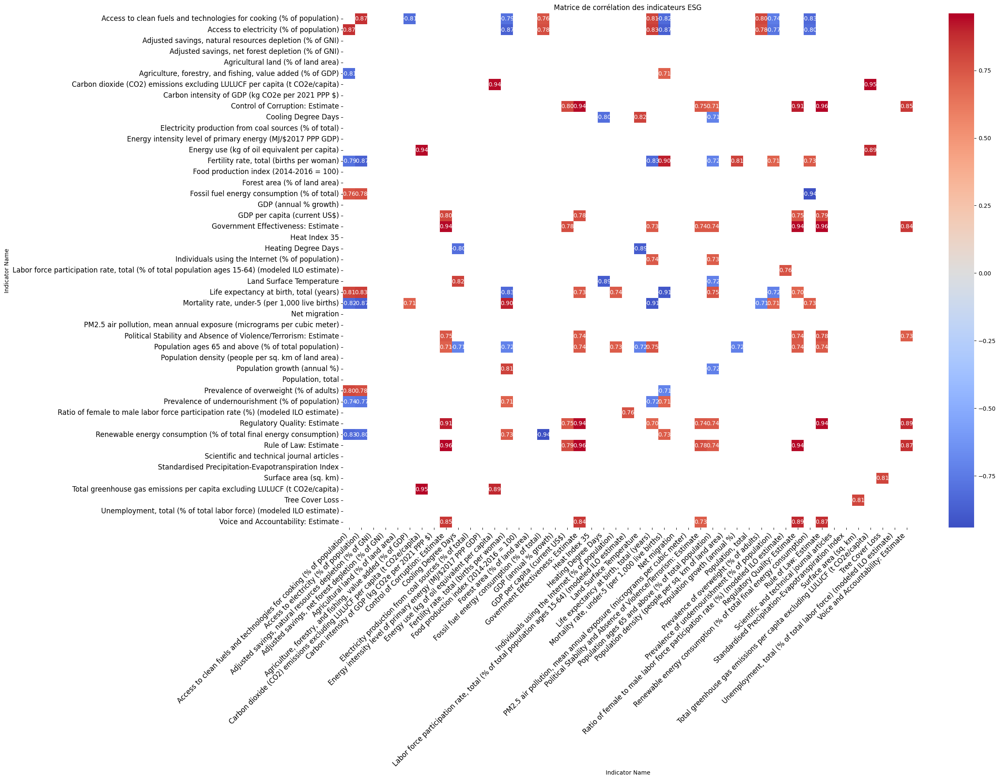

In [109]:
# Drow the correlation map
plt.figure(figsize=(22, 16))
sns.heatmap(
    strong_corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    annot_kws={"size": 10}  # Taille des nombres
)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)
plt.title("Matrice de corrélation des indicateurs ESG")
plt.show()


In [110]:
corr_with_CO2 = correlation_matrix["Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)"].sort_values(ascending=False).drop("Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)")
corr_with_CO2

,Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)
Indicator Name,
Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita),0.947901
Energy use (kg of oil equivalent per capita),0.893648
Government Effectiveness: Estimate,0.609367
Access to clean fuels and technologies for cooking (% of population),0.588911
Rule of Law: Estimate,0.584835
GDP per capita (current US$),0.581653
Regulatory Quality: Estimate,0.581477
Control of Corruption: Estimate,0.581423
Population ages 65 and above (% of total population),0.526757


In [111]:
comp_corr_with_CO2 = corr_with_CO2.reset_index()
comp_corr_with_CO2.rename(columns={"Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)": "Correlations before scaling"}, inplace=True)
rank = [i+1 for i in range(len(corr_with_CO2))]
comp_corr_with_CO2["Rank before scaling"] = rank
comp_corr_with_CO2


,Indicator Name,Correlations before scaling,Rank before scaling
0,Carbon dioxide (CO2) emissions excluding LULUC...,0.947901,1
1,Energy use (kg of oil equivalent per capita),0.893648,2
2,Government Effectiveness: Estimate,0.609367,3
3,Access to clean fuels and technologies for coo...,0.588911,4
4,Rule of Law: Estimate,0.584835,5
5,GDP per capita (current US$),0.581653,6
6,Regulatory Quality: Estimate,0.581477,7
7,Control of Corruption: Estimate,0.581423,8
8,Population ages 65 and above (% of total popul...,0.526757,9
9,"Life expectancy at birth, total (years)",0.522752,10


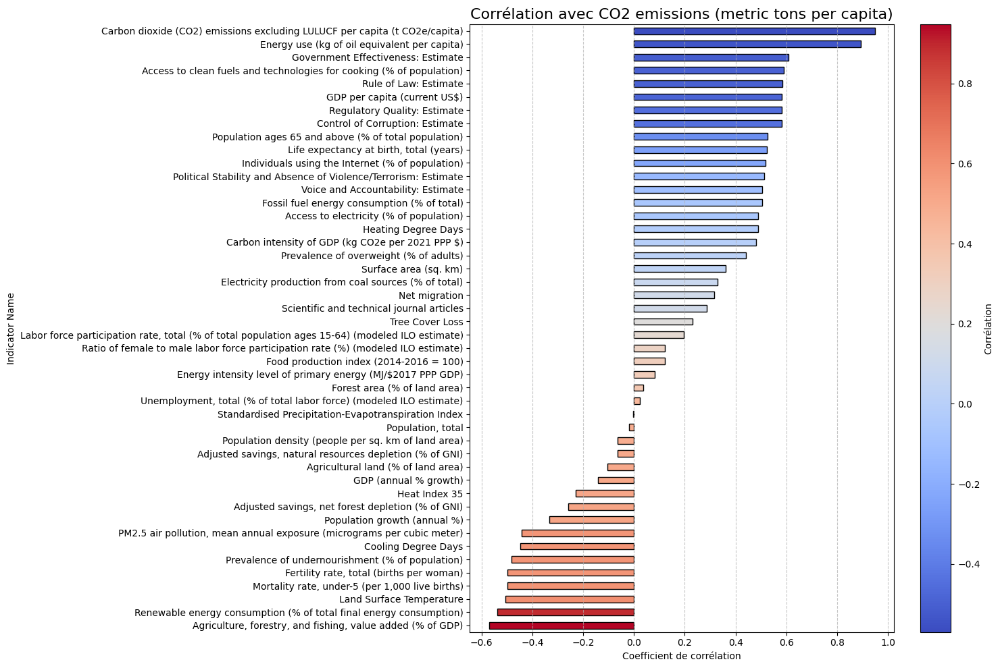

In [112]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(15, 10))

# Création des couleurs selon les valeurs de corrélation
norm = plt.Normalize(vmin=corr_with_CO2.min(), vmax=corr_with_CO2.max())
colors = plt.cm.coolwarm(norm(corr_with_CO2))

# Tracé du graphique horizontal
corr_with_CO2.sort_values().plot(
    kind='barh',
    color=colors,
    edgecolor='black',
    ax=ax
)

ax.set_title("Corrélation avec CO2 emissions (metric tons per capita)", fontsize=16)
ax.set_xlabel("Coefficient de corrélation")
ax.grid(axis='x', linestyle='--', alpha=0.7)

# Création de la colorbar liée explicitement à l'axe
sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax, label='Corrélation')

plt.tight_layout()
plt.show()


### Mondiales

# Changing scale


Oui, applique une échelle logarithmique (log10 ou log1p) pour les indicateurs très dispersés ou fortement asymétriques, notamment ceux liés à :

PIB, GNI, émissions, énergie, surfaces, ou stocks.

Tout indicateur dont la médiane est très proche de 0 et la queue droite très étirée.

Non nécessaire pour les indicateurs exprimés en % ou déjà bornés (taux de croissance, indices = 100 base, etc.) : la transformation log n’apporterait rien.

Si tes variables contiennent des zéros ou des valeurs négatives, utilise plutôt log1p(x) (= log(1+x))

| Valeur de skewness | Interprétation                                              | Action recommandée                                                         |
| -----------------: | ----------------------------------------------------------- | -------------------------------------------------------------------------- |
|                ≈ 0 | Distribution symétrique                                     | Pas besoin de transformation                                               |
|               > +1 | Forte asymétrie à droite (longue traîne de grandes valeurs) | ✅ Log-transform recommandée                                                |
|               < -1 | Forte asymétrie à gauche (longue traîne de petites valeurs) | 🔸 Éventuellement racine carrée, inverse, ou log sur les valeurs inversées |
|     Entre -1 et +1 | Distribution raisonnablement symétrique                     | Pas besoin de log                                                          |


Cas discutables (skew entre 1 et 2, log utile mais pas obligatoire)

| % d’outliers | Diagnostic                               | Recommandation                                                        |
| ------------ | ---------------------------------------- | --------------------------------------------------------------------- |
| **< 5 %**    | Variable stable                          | Rien à faire                                                          |
| **5–15 %**   | Distribution légèrement extrême          | PowerTransform possible                                               |
| **> 15 %**   | Beaucoup d’outliers                      | PowerTransform ou Winsorization fortement conseillé                   |
| **> 30 %**   | Distribution probablement non gaussienne | ⚠️ Traitement lourd nécessaire (Winsor + Power ou log + RobustScaler) |


| Ratio (max/min) ou échelle | Diagnostic            | Action                                      |
| -------------------------- | --------------------- | ------------------------------------------- |
| **< 10×**                  | Échelle homogène      | Aucun scaling spécial                       |
| **10× – 100×**             | Échelle déséquilibrée | MinMaxScaler ou StandardScaler              |
| **> 100×**                 | Très déséquilibrée    | PowerTransform ou log1p avant normalisation |


| ⚙️ Critère                                             | 🧠 Interprétation                              | 🚦 Action recommandée                                    |
| ------------------------------------------------------ | ---------------------------------------------- | -------------------------------------------------------- |
| **Outliers > 10% des valeurs**                         | Distribution possiblement instable             | ✅ Appliquer `RobustScaler` ou un **log/Power transform** |
| **Variance > 100× celle de la majorité des variables** | Échelle disproportionnée                       | ⚠️ Normaliser (`StandardScaler` ou `MinMaxScaler`)       |
| **Skewness > 1** ou **< -1**                           | Forte asymétrie                                | ✅ `PowerTransformer` ou `log1p`                          |
| **Outliers présents des deux côtés** mais skewness ≈ 0 | Variabilité large mais équilibrée              | ⚖️ `RobustScaler` possible mais pas obligatoire          |
| **Valeurs extrêmes qui dépassent 5–10× l’IQR**         | Outliers très éloignés du cœur de distribution | ⚠️ `RobustScaler` ou Winsorization (optionnel)           |


* Access to clean fuels and technologies for cooking (% of population)

-0.720495

Raisonnablement symétrique et pas d'outliers, pas de traitement

* Access to electricity (% of population)

-1.390253

Une trainée assez importante à gauche, PowerTransform

* Adjusted savings, natural resources depletion (% of GNI)

3.153817

Grosse trainée à droite, PowerTransform

* Adjusted savings, net forest depletion (% of GNI)

4.952256

Grosse trainée à droite, PowerTransform

* Agricultural land (% of land area)

-0.005880

Quasi symétrique et pas d'outlier, pas de traitement

* Agriculture, forestry, and fishing, value added (% of GDP)

1.256893

Une trainée assez importante à droite, PowerTransform

* Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita)

1.826369

Une trainée assez importante à droite, PowerTransform

* Carbon intensity of GDP (kg CO2e per 2021 PPP $)

2.677898

Grosse trainée à droite, PowerTransform

* Control of Corruption: Estimate

0.781454

Raisonnablement symétrique et pas d'outliers, pas de traitement

* Cooling Degree Days

0.319771

Raisonnablement symétrique et pas d'outliers, pas de traitement

* Electricity production from coal sources (% of total)

1.550135

Une trainée assez importante à droite, PowerTransform

* Energy intensity level of primary energy (MJ/$2017 PPP GDP)

2.640132

Grosse trainée à droite, PowerTransform

* Energy use (kg of oil equivalent per capita)

2.256956

Grosse trainée à droite, PowerTransform

* Fertility rate, total (births per woman)

1.216631

Petite trainée à droite, PowerTransform

* Food production index (2014-2016 = 100)

-0.235156
Raisonnablement symétrique mais des outliers positives et négatives qui représentent seulement 3.8%, les valeurs extrêmes ne sont tout au plus qu'à 2.5x IQR des bornes, pas de traitement

* Forest area (% of land area)

0.427249

Raisonnablement symétrique et pas d'outliers, pas de traitement

* Fossil fuel energy consumption (% of total)

-0.628786

Raisonnablement symétrique et pas d'outliers, pas de traitement

* GDP (annual % growth)

-0.116552
Raisonnablement symétrique mais des outliers positives et négatives qui représentent 5.6%, les valeurs extrêmes vont jusqu'à 10x IQR des bornes, la transormation logarithmique induit une grosse queue à gauche, on va utiliser une tanh scale à la place

* GDP per capita (current US$)

2.402419
Grosse trainée à droite, PowerTransform

* Government Effectiveness: Estimate

0.450237
Raisonnablement symétrique et pas d'outliers, pas de traitement

* Heat Index 35

3.846417
Grosse trainée à droite, PowerTransform

* Heating Degree Days

1.057167
Petite trainée à droite, PowerTransform

* Individuals using the Internet (% of population)

0.325369
Raisonnablement symétrique et pas d'outliers, pas de traitement

* Labor force participation rate, total (% of total population ages 15-64) (modeled ILO estimate)

-0.598088
Raisonnablement symétrique, quelques outliers (3.2%), proches des bornes (1x IQR), pas de traitement

* Land Surface Temperature

-0.688758
Raisonnablement symétrique, 1 seule outlier proches des bornes(1x IQR), pas de traitement

* Life expectancy at birth, total (years)

-0.690304
Raisonnablement symétrique, quelques outliers (0.6%), proches des bornes (1x IQR), pas de traitement

* Mortality rate, under-5 (per 1,000 live births)

1.627915
Petite trainée à droite, PowerTransform

* Net migration

-3.405858
Grosse trainée à gauche mais contient aussi des outliers positives,valeurs extrêmes jusqu'à 100x IQR, On va utiliser une échelle logarithmique

* PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)

1.565991
Petite trainée à droite, PowerTransform

* Political Stability and Absence of Violence/Terrorism: Estimate

-0.295473
Raisonnablement symétrique, 1 seule outlier proches des bornes(1x IQR), pas de traitement

* Population ages 65 and above (% of total population)

0.705232
Raisonnablement symétrique et pas d'outliers, pas de traitement

* Population density (people per sq. km of land area)

3.547971
Grosse trainée à droite, PowerTransform

* Population growth (annual %)

0.140965
Raisonnablement symétrique mais des outliers positives et négatives qui représentent 0.7%, les valeurs extrêmes vont jusqu'à 4 IQR des bornes, pas de traitement

* Population, total

6.588386
Grosse trainée à droite, PowerTransform

* Prevalence of overweight (% of adults)

-0.566301
Raisonnablement symétrique et pas d'outliers, pas de traitement

* Prevalence of undernourishment (% of population)

1.584973
Petite trainée à droite, PowerTransform

* Ratio of female to male labor force participation rate (%) (modeled ILO estimate)

-1.202337
Petite trainée à gauche, PowerTransform

* Regulatory Quality: Estimate

0.215443
Raisonnablement symétrique et pas d'outliers, pas de traitement

* Renewable energy consumption (% of total final energy consumption)

0.674504
Raisonnablement symétrique et pas d'outliers, pas de traitement

* Rule of Law: Estimate

0.529587
Raisonnablement symétrique et pas d'outliers, pas de traitement

* Scientific and technical journal articles

7.515625
Grosse trainée à droite, PowerTransform

* Standardised Precipitation-Evapotranspiration Index

0.182312
Raisonnablement symétrique, quelques outliers (0.1%), proches des bornes (1x IQR), pas de traitement

* Surface area (sq. km)

4.413926
Grosse trainée à droite, PowerTransform

* Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)

1.713441
Petite trainée à droite, PowerTransform

* Tree Cover Loss

5.803804
Grosse trainée à droite, PowerTransform

* Unemployment, total (% of total labor force) (modeled ILO estimate)

1.663545
Petite trainée à droite, PowerTransform

* Voice and Accountability: Estimate

-0.095637
Raisonnablement symétrique et pas d'outliers, pas de traitement


In [113]:
ESG_df_ByInd.skew(numeric_only=True)

,0
Indicator Name,
Access to clean fuels and technologies for cooking (% of population),-0.720495
Access to electricity (% of population),-1.390253
"Adjusted savings, natural resources depletion (% of GNI)",3.153817
"Adjusted savings, net forest depletion (% of GNI)",4.952256
Agricultural land (% of land area),-0.005880
"Agriculture, forestry, and fishing, value added (% of GDP)",1.256893
Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita),1.826369
Carbon intensity of GDP (kg CO2e per 2021 PPP $),2.677898
Control of Corruption: Estimate,0.781454


### Log Scale

In [114]:
ind_to_transform = ['Net migration']

In [115]:
# Log Scale
ESG_df_ByInd[ind_to_transform] = np.sign(ESG_df_ByInd[ind_to_transform]) * np.log1p(np.abs(ESG_df_ByInd[ind_to_transform]))

## Tanh Scale

In [116]:
ESG_df_ByInd['GDP (annual % growth)'] = np.tanh(ESG_df_ByInd['GDP (annual % growth)'] / 20)

## PowerTransform

In [117]:
ind_to_transform = ['Access to electricity (% of population)',
                    'Adjusted savings, natural resources depletion (% of GNI)',
                    'Adjusted savings, net forest depletion (% of GNI)',
                    'Agriculture, forestry, and fishing, value added (% of GDP)',
                    'Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita)',
                    'Carbon intensity of GDP (kg CO2e per 2021 PPP $)',
                    'Electricity production from coal sources (% of total)',
                    'Energy intensity level of primary energy (MJ/$2017 PPP GDP)',
                    'Energy use (kg of oil equivalent per capita)',
                    'Fertility rate, total (births per woman)',
                    'GDP per capita (current US$)',
                    'Heat Index 35',
                    'Heating Degree Days',
                    'Mortality rate, under-5 (per 1,000 live births)',
                    'PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)',
                    'Population density (people per sq. km of land area)',
                    'Population, total',
                    'Prevalence of undernourishment (% of population)',
                    'Ratio of female to male labor force participation rate (%) (modeled ILO estimate)',
                    'Scientific and technical journal articles',
                    'Surface area (sq. km)',
                    'Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)',
                    'Tree Cover Loss',
                    'Unemployment, total (% of total labor force) (modeled ILO estimate)']

In [118]:
# Power Transform
pt = PowerTransformer()

indicators = ESG_df_ByInd.columns.drop(["Country Name","Year"])
before_transform = {}

# Skewness before transformation
for ind in indicators:
  if ind in ind_to_transform:
    before_transform[ind] = ESG_df_ByInd[ind].skew()

# Make transformation
ESG_df_ByInd[ind_to_transform] = pt.fit_transform(ESG_df_ByInd[ind_to_transform])

# See the results
for ind in indicators:
  print(f"----------\n{ind}")
  if ind in ind_to_transform:
    print(f"Skewness before transformation : {before_transform[ind]}")
    print(f"Skewness after transformation : {ESG_df_ByInd[ind].skew()}")
  else:
    print(f"No modifications, skewness : {ESG_df_ByInd[ind].skew()}")

----------
Access to clean fuels and technologies for cooking (% of population)
No modifications, skewness : -0.7204953533123513
----------
Access to electricity (% of population)
Skewness before transformation : -1.3902533457051263
Skewness after transformation : -0.9856780915014678
----------
Adjusted savings, natural resources depletion (% of GNI)
Skewness before transformation : 3.153816748984066
Skewness after transformation : 0.24361523543934951
----------
Adjusted savings, net forest depletion (% of GNI)
Skewness before transformation : 4.95225573396936
Skewness after transformation : 1.2243108430064802
----------
Agricultural land (% of land area)
No modifications, skewness : -0.005880025886517999
----------
Agriculture, forestry, and fishing, value added (% of GDP)
Skewness before transformation : 1.2568926290879565
Skewness after transformation : -0.014909699305127916
----------
Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita)
Skewness before transfo

## Visualiser la nouvelle distribution

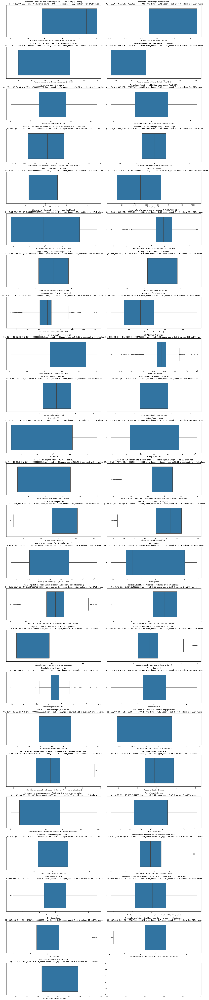

In [119]:
# Visualiser la nouvelle distribution
fig, axs = plt.subplots(24, 2, figsize=(20, 100))
axs = axs.flatten()

for column,ax in zip(ESG_df_ByInd.columns.drop(["Country Name","Year"]),axs):

  column_data = ESG_df_ByInd[column].dropna()

  Q1 = np.percentile(column_data, 25)
  Q3 = np.percentile(column_data, 75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  outliers = [x for x in column_data if x < lower_bound or x > upper_bound]

  sns.boxplot(x=column, data=ESG_df_ByInd, ax=ax)
  ax.set_title(f'{column} \n Q1: {np.round(Q1,2)}, Q3: {np.round(Q3,2)}, IQR: {IQR}, lower_bound: {np.round(lower_bound,2)}, upper_bound: {np.round(upper_bound,2)}, # outliers: {len(outliers)} on {nb_data_by_indicator} values')

plt.tight_layout()
plt.show()

## StandarScaler

In [120]:
ss = StandardScaler()
indicators = ESG_df_ByInd.columns.drop(["Country Name","Year"])
ESG_df_ByInd[indicators] = ss.fit_transform(ESG_df_ByInd[indicators])

# Correlations

## Variance

In [121]:
ESG_df_ByInd.drop(columns=["Country Name","Year"]).var()

,0
Indicator Name,
Access to clean fuels and technologies for cooking (% of population),1.000369
Access to electricity (% of population),1.000369
"Adjusted savings, natural resources depletion (% of GNI)",1.000369
"Adjusted savings, net forest depletion (% of GNI)",1.000369
Agricultural land (% of land area),1.000369
"Agriculture, forestry, and fishing, value added (% of GDP)",1.000369
Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita),1.000369
Carbon intensity of GDP (kg CO2e per 2021 PPP $),1.000369
Control of Corruption: Estimate,1.000369


## Correlations

In [122]:
# Correlation matrix
correlation_matrix = ESG_df_ByInd.drop(columns=["Country Name","Year"]).corr()

threshold = 0.9
strong_corr = correlation_matrix[(correlation_matrix.abs() > threshold) & (correlation_matrix != 1.0)]

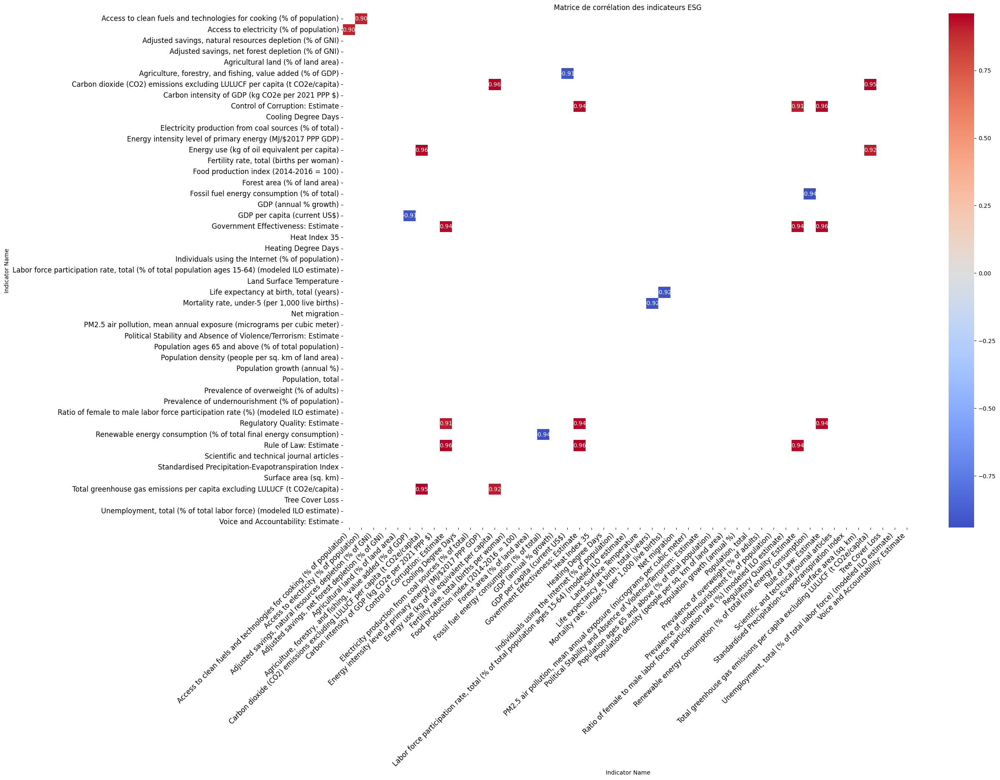

In [123]:
# Drow the correlation map
plt.figure(figsize=(22, 16))
sns.heatmap(
    strong_corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    annot_kws={"size": 10}  # Taille des nombres
)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)
plt.title("Matrice de corrélation des indicateurs ESG")
plt.show()


In [124]:
corr_with_CO2 = correlation_matrix["Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)"].sort_values(ascending=False).drop("Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)")
corr_with_CO2

,Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)
Indicator Name,
Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita),0.948661
Energy use (kg of oil equivalent per capita),0.915147
GDP per capita (current US$),0.809540
Access to clean fuels and technologies for cooking (% of population),0.779402
Access to electricity (% of population),0.713640
Government Effectiveness: Estimate,0.672182
"Life expectancy at birth, total (years)",0.667263
Fossil fuel energy consumption (% of total),0.665974
Population ages 65 and above (% of total population),0.665755


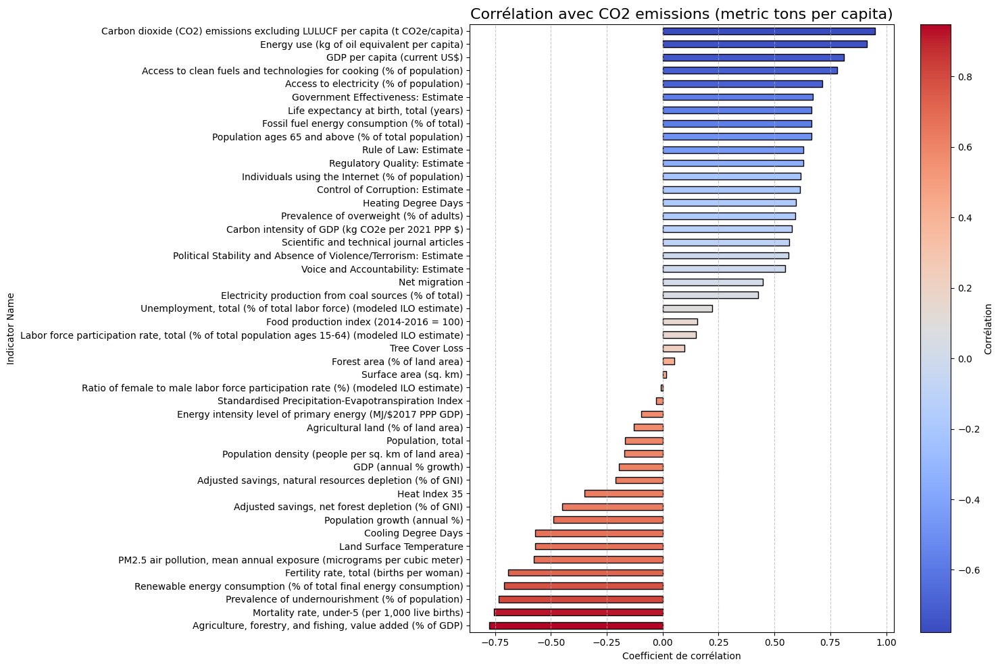

In [125]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(15, 10))

# Création des couleurs selon les valeurs de corrélation
norm = plt.Normalize(vmin=corr_with_CO2.min(), vmax=corr_with_CO2.max())
colors = plt.cm.coolwarm(norm(corr_with_CO2))

# Tracé du graphique horizontal
corr_with_CO2.sort_values().plot(
    kind='barh',
    color=colors,
    edgecolor='black',
    ax=ax
)

ax.set_title("Corrélation avec CO2 emissions (metric tons per capita)", fontsize=16)
ax.set_xlabel("Coefficient de corrélation")
ax.grid(axis='x', linestyle='--', alpha=0.7)

# Création de la colorbar liée explicitement à l'axe
sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax, label='Corrélation')

plt.tight_layout()
plt.show()


In [126]:
corr_with_CO2 = corr_with_CO2.reset_index()
corrs = []
rank = []

for ind in comp_corr_with_CO2["Indicator Name"].unique():
  rank.append(corr_with_CO2[corr_with_CO2["Indicator Name"] == ind].index[0]+1)
  corrs.append(corr_with_CO2[corr_with_CO2["Indicator Name"] == ind]['Total greenhouse gas emissions per capita excluding LULUCF (t CO2e/capita)'].values[0])

comp_corr_with_CO2["Correlation after scaling"] = corrs
comp_corr_with_CO2["Rank after scaling"] = rank

comp_corr_with_CO2

,Indicator Name,Correlations before scaling,Rank before scaling,Correlation after scaling,Rank after scaling
0,Carbon dioxide (CO2) emissions excluding LULUC...,0.947901,1,0.948661,1
1,Energy use (kg of oil equivalent per capita),0.893648,2,0.915147,2
2,Government Effectiveness: Estimate,0.609367,3,0.672182,6
3,Access to clean fuels and technologies for coo...,0.588911,4,0.779402,4
4,Rule of Law: Estimate,0.584835,5,0.630295,10
5,GDP per capita (current US$),0.581653,6,0.809540,3
6,Regulatory Quality: Estimate,0.581477,7,0.629054,11
7,Control of Corruption: Estimate,0.581423,8,0.615293,13
8,Population ages 65 and above (% of total popul...,0.526757,9,0.665755,9
9,"Life expectancy at birth, total (years)",0.522752,10,0.667263,7


# Selection de variable

In [127]:
# On va conserver les indicateurs avec une corrélation > 0.4

comp_corr_with_CO2 = comp_corr_with_CO2[abs(comp_corr_with_CO2["Correlation after scaling"]) > 0.4]
list_indicator_for_analyse = comp_corr_with_CO2['Indicator Name'].unique().tolist()
print(len(list_indicator_for_analyse))
list_indicator_for_analyse

31


['Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita)',
 'Energy use (kg of oil equivalent per capita)',
 'Government Effectiveness: Estimate',
 'Access to clean fuels and technologies for cooking (% of population)',
 'Rule of Law: Estimate',
 'GDP per capita (current US$)',
 'Regulatory Quality: Estimate',
 'Control of Corruption: Estimate',
 'Population ages 65 and above (% of total population)',
 'Life expectancy at birth, total (years)',
 'Individuals using the Internet (% of population)',
 'Political Stability and Absence of Violence/Terrorism: Estimate',
 'Voice and Accountability: Estimate',
 'Fossil fuel energy consumption (% of total)',
 'Access to electricity (% of population)',
 'Heating Degree Days',
 'Carbon intensity of GDP (kg CO2e per 2021 PPP $)',
 'Prevalence of overweight (% of adults)',
 'Electricity production from coal sources (% of total)',
 'Net migration',
 'Scientific and technical journal articles',
 'Adjusted savings, net forest deplet

In [128]:
# Certains indicateurs ont une forte corrélation entre eux, les conserver tous n'est pas très intérréssant

to_remove = ["Control of Corruption: Estimate","Regulatory Quality: Estimate","Rule of Law: Estimate"]
correlation_matrix[abs(correlation_matrix["Government Effectiveness: Estimate"])>=0.9]["Government Effectiveness: Estimate"]

,Government Effectiveness: Estimate
Indicator Name,
Control of Corruption: Estimate,0.941133
Government Effectiveness: Estimate,1.000000
Regulatory Quality: Estimate,0.939929
Rule of Law: Estimate,0.959636


In [129]:
# Certains indicateurs ont une forte corrélation entre eux, les conserver tous n'est pas très intérréssant

to_remove.append("Access to clean fuels and technologies for cooking (% of population)")
correlation_matrix[abs(correlation_matrix["Access to electricity (% of population)"])>=0.9]["Access to electricity (% of population)"]

,Access to electricity (% of population)
Indicator Name,
Access to clean fuels and technologies for cooking (% of population),0.900886
Access to electricity (% of population),1.000000


In [130]:
# Certains indicateurs ont une forte corrélation entre eux, les conserver tous n'est pas très intérréssant

to_remove.append("Mortality rate, under-5 (per 1,000 live births)")
correlation_matrix[abs(correlation_matrix["Mortality rate, under-5 (per 1,000 live births)"])>=0.9]["Mortality rate, under-5 (per 1,000 live births)"]

,"Mortality rate, under-5 (per 1,000 live births)"
Indicator Name,
"Life expectancy at birth, total (years)",-0.920797
"Mortality rate, under-5 (per 1,000 live births)",1.000000


In [131]:
list_indicator_for_analyse = [
    x for x in list_indicator_for_analyse
    if x not in to_remove
]
print(len(list_indicator_for_analyse))
list_indicator_for_analyse

26


['Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita)',
 'Energy use (kg of oil equivalent per capita)',
 'Government Effectiveness: Estimate',
 'GDP per capita (current US$)',
 'Population ages 65 and above (% of total population)',
 'Life expectancy at birth, total (years)',
 'Individuals using the Internet (% of population)',
 'Political Stability and Absence of Violence/Terrorism: Estimate',
 'Voice and Accountability: Estimate',
 'Fossil fuel energy consumption (% of total)',
 'Access to electricity (% of population)',
 'Heating Degree Days',
 'Carbon intensity of GDP (kg CO2e per 2021 PPP $)',
 'Prevalence of overweight (% of adults)',
 'Electricity production from coal sources (% of total)',
 'Net migration',
 'Scientific and technical journal articles',
 'Adjusted savings, net forest depletion (% of GNI)',
 'Population growth (annual %)',
 'PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)',
 'Cooling Degree Days',
 'Prevalence of und

In [132]:
to_drop = ESG_df_ByInd.columns.drop(["Country Name","Year"] + list_indicator_for_analyse)
ESG_df_ByInd = ESG_df_ByInd.drop(columns=to_drop)
ESG_df_ByInd

Indicator Name,Country Name,Year,Access to electricity (% of population),"Adjusted savings, net forest depletion (% of GNI)","Agriculture, forestry, and fishing, value added (% of GDP)",Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita),Carbon intensity of GDP (kg CO2e per 2021 PPP $),Cooling Degree Days,Electricity production from coal sources (% of total),Energy use (kg of oil equivalent per capita),...,Net migration,"PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)",Political Stability and Absence of Violence/Terrorism: Estimate,Population ages 65 and above (% of total population),Population growth (annual %),Prevalence of overweight (% of adults),Prevalence of undernourishment (% of population),Renewable energy consumption (% of total final energy consumption),Scientific and technical journal articles,Voice and Accountability: Estimate
23,Albania,2000,0.691239,0.064034,1.210175,-0.747642,-0.080618,-0.903055,-1.038571,-0.714634,...,-0.961622,0.029036,-0.442294,-0.252149,-1.573598,0.498963,-0.552982,0.243047,-1.475171,-0.326914
24,Albania,2001,0.691239,-0.253424,1.117668,-0.700339,-0.121297,-0.916103,-1.038571,-0.685163,...,-0.939330,0.037111,-0.308698,-0.206140,-1.826431,0.523237,-0.236356,0.159072,-1.552120,-0.184735
25,Albania,2002,0.691239,-0.229850,1.078792,-0.592344,0.070525,-0.975151,-1.038571,-0.582323,...,-0.933329,0.046421,-0.175102,-0.154529,-1.290201,0.549287,0.004067,0.047105,-1.438175,-0.042556
26,Albania,2003,0.691239,-0.249471,1.081296,-0.553596,0.066357,-0.799473,-1.038571,-0.600760,...,-0.940225,0.055191,-0.188445,-0.099907,-1.352507,0.576522,0.240396,-0.026373,-1.469200,0.038058
27,Albania,2004,0.691239,-0.298691,1.007960,-0.515852,0.059043,-0.979691,-1.038571,-0.499665,...,-0.940498,0.061705,-0.318016,-0.042208,-1.389285,0.604349,0.401286,0.047105,-1.562306,-0.026742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4250,Zimbabwe,2018,-1.570961,1.738430,0.014006,-0.900648,0.573128,0.065806,1.214378,-0.991442,...,-1.025983,-0.244436,-0.641889,-0.898649,0.210586,-0.703501,1.617619,1.583145,-0.346921,-1.202170
4251,Zimbabwe,2019,-1.543954,1.892073,0.314951,-0.962319,0.521939,0.228826,1.251175,-1.071849,...,-1.013133,-0.300066,-0.887026,-0.887092,0.274487,-0.672122,1.628176,1.628632,-0.315061,-1.230308
4252,Zimbabwe,2020,-1.404089,1.923284,0.197976,-1.077672,0.292655,0.053586,1.185033,-1.174828,...,-0.999380,-0.208936,-1.007665,-0.879148,0.355014,-0.639559,1.629662,1.737099,-0.288845,-1.178756
4253,Zimbabwe,2021,-1.493335,1.869228,0.206980,-1.007176,0.431786,0.002666,1.041054,-1.088846,...,-0.981863,-0.122295,-0.899266,-0.876422,0.410938,-0.606404,1.620663,1.677617,-0.257253,-1.205867


In [133]:
to_drop = ESG_df_ByInd_verified_not_filtered_not_transformed.columns.drop(["Country Name","Year"] + list_indicator_for_analyse)
ESG_df_ByInd_verified_not_filtered_not_transformed = ESG_df_ByInd_verified_not_filtered_not_transformed.drop(columns=to_drop)
ESG_df_ByInd_verified_not_filtered_not_transformed

Indicator Name,Country Name,Year,Access to electricity (% of population),"Adjusted savings, net forest depletion (% of GNI)","Agriculture, forestry, and fishing, value added (% of GDP)",Carbon dioxide (CO2) emissions excluding LULUCF per capita (t CO2e/capita),Carbon intensity of GDP (kg CO2e per 2021 PPP $),Cooling Degree Days,Electricity production from coal sources (% of total),Energy use (kg of oil equivalent per capita),...,Net migration,"PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)",Political Stability and Absence of Violence/Terrorism: Estimate,Population ages 65 and above (% of total population),Population growth (annual %),Prevalence of overweight (% of adults),Prevalence of undernourishment (% of population),Renewable energy consumption (% of total final energy consumption),Scientific and technical journal articles,Voice and Accountability: Estimate
23,Albania,2000,99.4,0.1229,22.1790,1.0464,0.1590,689.04,0.0000,581.3747,...,-60531.0,22.2652,-0.54000,7.3307,-0.6374,52.56,3.8,41.4,22.34,-0.28510
24,Albania,2001,99.4,0.0607,20.4524,1.1239,0.1554,662.54,0.0000,598.2283,...,-48070.0,22.3660,-0.41885,7.6058,-0.9385,52.97,4.9,39.0,18.38,-0.14665
25,Albania,2002,99.4,0.0649,19.7639,1.3131,0.1730,542.61,0.0000,661.1180,...,-45178.0,22.4828,-0.29770,7.9144,-0.2999,53.41,6.0,35.8,24.53,-0.00820
26,Albania,2003,99.4,0.0614,19.8076,1.3854,0.1726,899.42,0.0000,649.3579,...,-48517.0,22.5934,-0.30980,8.2410,-0.3741,53.87,7.4,33.7,22.68,0.07030
27,Albania,2004,99.4,0.0528,18.5631,1.4582,0.1719,533.39,0.0000,716.6231,...,-48654.0,22.6759,-0.42730,8.5860,-0.4179,54.34,8.6,35.8,17.91,0.00720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4250,Zimbabwe,2018,45.4,1.3051,7.3194,0.8161,0.2284,2656.84,44.1136,445.1751,...,-117758.0,19.1121,-0.72100,3.4651,1.4874,32.25,38.7,79.7,392.50,-1.13740
4251,Zimbabwe,2019,46.7,2.0280,9.8193,0.7314,0.2220,2987.94,48.2232,412.1654,...,-103107.0,18.5286,-0.94330,3.5342,1.5635,32.78,39.4,81.0,426.38,-1.16480
4252,Zimbabwe,2020,52.7,2.3159,8.7729,0.5843,0.1956,2632.02,41.1209,373.5572,...,-89440.0,19.4942,-1.05270,3.5817,1.6594,33.33,39.5,84.1,456.49,-1.11460
4253,Zimbabwe,2021,49.0,1.8659,8.8499,0.6725,0.2112,2528.60,29.4042,405.5186,...,-74623.0,20.4598,-0.95440,3.5980,1.7260,33.89,38.9,82.4,495.68,-1.14100


In [134]:
# Garder les transformateur et les datasets
ESG_df_ByInd.to_csv("ESG_df_ByInd_filtered_transformed.csv", index=False)
ESG_df_ByInd_verified_not_filtered_not_transformed.to_csv('ESG_df_ByInd_verified_not_filtered_not_transformed.csv', index=False)

dump(pt, 'power_tansform.joblib')
dump(ss, 'standar_scaler.joblib')

['standar_scaler.joblib']

# Bibliography

* https://statisticsbyjim.com/basics/remove-outliers/
* https://www.neuraldesigner.com/blog/effective-outlier-treatment-methods-machine-learning/